In [1]:
import requests
import datetime
import time
import csv
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.neighbors import KNeighborsClassifier
from scipy.stats import randint
from imblearn.over_sampling import SMOTE
pd.set_option('display.max_columns', None)
plt.style.use('seaborn')
import xgboost as xgb
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'
from xgboost import XGBClassifier
import seaborn as sns
import pickle
import joblib

Using TensorFlow backend.


In [2]:
# pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None)

In [50]:
real_model_df = pd.read_csv('real_model_df.csv')
real_model_df.drop('Unnamed: 0', axis=1, inplace=True)
real_model_df

,fight,date,fighter_1,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,winner,fighter_2,cumultime_2,cumulStr_Att_fighter_2,cumulStr_Att_oponent_2,cumulTD_Att_fighter_2,cumulTD_Att_oponent_2,KDPM_2,KDPM_ratio_2,SLPM_2,SLPM_ratio_2,SAPM_2,SAPM_ratio_2,Str_Acc_2,Str_Def_2,TD_Acc_2,TD_Def_2,SubPM_2,PassPM_2,RevPM_2,Head_SLPM_2,Body_SLPM_2,Leg_SLPM_2,Dist_SLPM_2,Clinch_SLPM_2,Ground_SLPM_2,wins_2,losses_2,implied_prob_2,prev_2,height_2,weight_2,reach_2,age_2,stance_Orthodox_2,stance_Southpaw_2,stance_Switch_2
0,Erick Silva vs Neil Magny,2015-08-23,Neil-Magny,56.050000,980.0,528.0,44.0,54.0,0.005049,0.000000,1.760172,0.633346,0.704148,0.101334,0.004794,0.012334,0.120545,0.104416,0.005299,0.103628,0.009983,1.266204,0.288154,0.205814,0.861161,0.427905,0.471106,8,3,0.381679,11,75.0,170.0,80.0,28.0,1,0,0,1,Erick-Silva,28.550000,233.0,377.0,8.0,33.0,0.060912,0.000000,2.311681,0.414093,1.815724,0.420818,0.025329,0.012281,0.208333,0.180014,0.099449,0.078695,0.000000,1.690404,0.564027,0.057249,0.665340,0.268043,1.378298,6,4,0.628931,10,72.0,170.0,74.0,31.0,1,0,0
1,Marc Diakiese vs Teemu Packalen,2017-03-18,Marc-Diakiese,12.666667,150.0,105.0,14.0,9.0,0.000000,0.000000,0.770234,0.215977,0.518134,0.209978,0.004523,0.011609,0.104396,0.148148,0.000000,0.033835,0.000000,0.557939,0.103494,0.108801,0.518797,0.192393,0.059045,2,0,0.666667,2,70.0,155.0,73.0,24.0,1,0,0,1,Teemu-Packalen,7.400000,72.0,86.0,11.0,1.0,0.337838,0.000000,2.702703,0.109994,0.830116,0.166023,0.015545,0.017373,0.024793,1.000000,0.357143,0.511583,0.000000,2.567568,0.115830,0.019305,1.216216,0.000000,1.486486,1,1,0.343643,2,73.0,155.0,75.0,29.0,1,0,0
2,Tecia Torres vs Weili Zhang,2019-03-02,Weili-Zhang,10.683333,252.0,135.0,5.0,2.0,0.000000,0.000000,2.173216,0.680004,0.683362,0.060052,0.004654,0.007212,0.166667,1.000000,0.050826,0.064198,0.000000,1.329391,0.378469,0.465356,1.025648,0.129726,1.017842,2,0,0.555556,2,64.0,115.0,63.0,29.0,0,0,1,1,Tecia-Torres,57.883333,1143.0,1139.0,41.0,28.0,0.002468,0.000000,1.480200,0.266552,1.007694,0.121249,0.003925,0.005307,0.077236,0.148810,0.009173,0.033853,0.000000,0.884992,0.288431,0.306777,1.161782,0.230268,0.088150,6,3,0.416667,9,61.0,115.0,60.0,29.0,1,0,0
3,Urijah Faber vs Ricky Simon,2019-07-13,Urijah-Faber,98.066667,1607.0,1919.0,89.0,48.0,0.011927,0.000000,1.179982,0.352180,0.991396,0.173518,0.004591,0.005525,0.051524,0.091232,0.022279,0.031277,0.006395,0.881764,0.217457,0.080760,0.706166,0.149947,0.323869,10,6,0.238095,16,66.0,135.0,67.0,40.0,1,0,0,1,Ricky-Simon,21.000000,293.0,490.0,32.0,33.0,0.013605,0.000000,0.768707,0.109598,1.020408,0.206880,0.004082,0.004102,0.044866,0.052342,0.006803,0.054422,0.006803,0.489796,0.170068,0.108844,0.571429,0.081633,0.115646,3,0,0.714286,3,66.0,135.0,69.0,26.0,1,0,0
4,Anthony Pettis vs Jim Miller,2017-07-08,Anthony-Pettis,59.150000,867.0,945.0,15.0,65.0,0.019067,0.000000,1.241935,0.217224,1.172125,0.185897,0.005827,0.006997,0.044444,0.064790,0.016318,0.024383,0.028011,0.878335,0.227192,0.136408,1.058264,0.048451,0.135220,6,5,0.675676,11,70.0,170.0,72.0,30.0,1,0,0,1,Jim-Miller,132.850000,1902.0,1869.0,74.0,61.0,0.008944,0.000000,1.018091,0.301817,0.897850,0.268107,0.004820,0.008376,0.137709,0.156740,0.059868,0.058093,0.005132,0.637816,0.192071,0.188204,0.674569,0.161144,0.182378,17,8,0.341297,25,68.0,155.0,71.0,33.0,0,1,0
5,Yair Rodriguez vs Alex Caceres,2016-08-06,Yair-Rodriguez,24.250000,340.0,261.0,18.0,20.0,0.012688,0.000000,1.153733,0.308279,0.675654,0.101955,0.005710,0.009397,0.141975,0.140476,0.041237,0.073411,0.011782,0.610853,0.283222,0.259658,0.827461,0.088365,0.237906,4,0,0.724638,4,71.0,145.0,71.0,23.0,1,0,0,1,Alex-Cace

In [51]:
real = real_model_df.sort_values(by='date')

In [52]:
len(real)

1464

In [53]:
real

,fight,date,fighter_1,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,winner,fighter_2,cumultime_2,cumulStr_Att_fighter_2,cumulStr_Att_oponent_2,cumulTD_Att_fighter_2,cumulTD_Att_oponent_2,KDPM_2,KDPM_ratio_2,SLPM_2,SLPM_ratio_2,SAPM_2,SAPM_ratio_2,Str_Acc_2,Str_Def_2,TD_Acc_2,TD_Def_2,SubPM_2,PassPM_2,RevPM_2,Head_SLPM_2,Body_SLPM_2,Leg_SLPM_2,Dist_SLPM_2,Clinch_SLPM_2,Ground_SLPM_2,wins_2,losses_2,implied_prob_2,prev_2,height_2,weight_2,reach_2,age_2,stance_Orthodox_2,stance_Southpaw_2,stance_Switch_2
467,Ryan Bader vs Rogerio Nogueira,2010-09-25,Ryan-Bader,20.466667,314.0,253.0,20.0,0.0,0.046930,0.000000,1.189196,0.509609,0.498189,0.080115,0.005444,0.012539,0.089881,NaN,0.013960,0.100233,0.000000,0.830279,0.115079,0.243838,0.712250,0.159144,0.317802,4,0,0.769231,4,74.0,205.0,74.0,27.0,1,0,0,1,Rogerio-Nogueira,8.933333,95.0,64.0,1.0,13.0,0.057900,0.000000,1.178406,0.665423,0.461547,0.111593,0.008877,0.022277,1.000000,0.059172,0.015991,0.031983,0.047974,0.892765,0.063966,0.221675,1.098449,0.015991,0.063966,2,0,0.273973,2,74.0,205.0,75.0,34.0,0,1,0
654,Dan Henderson vs Mauricio Rua,2011-11-19,Dan-Henderson,33.200000,403.0,435.0,17.0,20.0,0.011254,0.000000,0.840690,0.151601,0.925876,0.182775,0.005828,0.005705,0.080882,0.110417,0.010040,0.028914,0.003347,0.506444,0.126940,0.207306,0.403615,0.243105,0.193971,3,2,0.392157,5,71.0,185.0,74.0,41.0,1,0,0,1,Mauricio-Rua,36.900000,452.0,487.0,20.0,17.0,0.036232,0.000000,1.161116,0.407508,1.097689,0.345949,0.008074,0.007932,0.045833,0.013072,0.008212,0.011669,0.000000,0.702672,0.169676,0.288768,0.654772,0.238595,0.267749,4,3,0.606061,7,73.0,205.0,76.0,29.0,1,0,0
1408,Dan Henderson vs Mauricio Rua,2011-11-19,Mauricio-Rua,36.900000,452.0,487.0,20.0,17.0,0.036232,0.000000,1.161116,0.407508,1.097689,0.345949,0.008074,0.007932,0.045833,0.013072,0.008212,0.011669,0.000000,0.702672,0.169676,0.288768,0.654772,0.238595,0.267749,4,3,0.606061,7,73.0,205.0,76.0,29.0,1,0,0,2,Dan-Henderson,33.200000,403.0,435.0,17.0,20.0,0.011254,0.000000,0.840690,0.151601,0.925876,0.182775,0.005828,0.005705,0.080882,0.110417,0.010040,0.028914,0.003347,0.506444,0.126940,0.207306,0.403615,0.243105,0.193971,3,2,0.392157,5,71.0,185.0,74.0,41.0,1,0,0
203,Renan Barao vs Urijah Faber,2012-07-21,Renan-Barao,18.150000,485.0,327.0,8.0,8.0,0.013276,0.000000,1.671859,0.369745,0.935596,0.088299,0.002573,0.006180,0.107143,0.250000,0.013276,0.029018,0.000000,1.077652,0.299569,0.294638,1.571528,0.023613,0.076718,3,0,0.769231,3,66.0,145.0,70.0,25.0,1,0,0,1,Urijah-Faber,18.450000,341.0,377.0,17.0,16.0,0.022123,0.000000,1.476934,0.421644,0.914772,0.129301,0.003900,0.006036,0.081283,0.084936,0.022123,0.044245,0.022123,1.151239,0.231551,0.094144,0.778718,0.152892,0.545324,2,1,0.246914,3,66.0,135.0,67.0,33.0,1,0,0
1324,Renan Barao vs Urijah Faber,2012-07-21,Urijah-Faber,18.450000,341.0,377.0,17.0,16.0,0.022123,0.000000,1.476934,0.421644,0.914772,0.129301,0.003900,0.006036,0.081283,0.084936,0.022123,0.044245,0.022123,1.151239,0.231551,0.094144,0.778718,0.152892,0.545324,2,1,0.246914,3,66.0,135.0,67.0,33.0,1,0,0,2,Renan-Barao,18.150000,485.0,327.0,8.0,8.0,0.013276,0.000000,1.671859,0.369745,0.935596,0.088299,0.002573,0.006180,0.107143,0.250000,0.013276,0.029018,0.000000,1.077652,0.299569,0.294638,1.571528,0.023613,0.076718,3,0,0.769231,3,66.0,135.0,70.0,25.0,1,0,0
61,Joe Lauzon vs Jim Miller,2012-12-29,Jim-Miller,66.083333,910.0,837.0,46.0,30.0,0.017980,0.000000,0.993483,0.320732,0.820672,0.317299,0.004771,0.009857,0.117184,0.167778,0.088393,0.080435,0.004324,0.651586,0.152012,0.189885,0.575181,0.152949,0.265353,10,3,0.444444,13,68.0,155.0,71.0,29.0,0,1,0,1,Joe-Lauzon,39.50

In [54]:
real[8:]

,fight,date,fighter_1,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,winner,fighter_2,cumultime_2,cumulStr_Att_fighter_2,cumulStr_Att_oponent_2,cumulTD_Att_fighter_2,cumulTD_Att_oponent_2,KDPM_2,KDPM_ratio_2,SLPM_2,SLPM_ratio_2,SAPM_2,SAPM_ratio_2,Str_Acc_2,Str_Def_2,TD_Acc_2,TD_Def_2,SubPM_2,PassPM_2,RevPM_2,Head_SLPM_2,Body_SLPM_2,Leg_SLPM_2,Dist_SLPM_2,Clinch_SLPM_2,Ground_SLPM_2,wins_2,losses_2,implied_prob_2,prev_2,height_2,weight_2,reach_2,age_2,stance_Orthodox_2,stance_Southpaw_2,stance_Switch_2
1277,Phil Davis vs Vinny Magalhaes,2013-04-27,Vinny-Magalhaes,11.533333,187.0,207.0,6.0,2.0,0.000000,0.000000,1.154280,0.252693,1.421059,0.483594,0.006520,0.007808,0.166667,0.250000,0.077646,0.114806,0.000000,0.375460,0.664014,0.114806,0.499276,0.465879,0.189125,1,2,0.281690,3,75.0,205.0,79.0,28.0,1,0,0,2,Phil-Davis,44.316667,635.0,287.0,41.0,11.0,0.000000,0.000000,0.981891,1.452882,0.252359,0.041188,0.005656,0.019204,0.100468,0.204545,0.027566,0.138264,0.000000,0.465243,0.373185,0.143463,0.283842,0.175119,0.522929,6,1,0.735294,7,74.0,205.0,79.0,28.0,1,0,0
832,Cody McKenzie vs Leonard Garcia,2013-04-27,Leonard-Garcia,52.350000,1298.0,1307.0,12.0,21.0,0.002729,0.000000,0.884052,0.087482,1.649638,0.810422,0.001877,0.003138,0.097222,0.074830,0.009832,0.022956,0.016936,0.577182,0.145558,0.161312,0.767949,0.069149,0.046953,2,6,0.653595,8,70.0,145.0,69.0,33.0,1,0,0,2,Cody-McKenzie,16.016667,130.0,146.0,10.0,5.0,0.000000,0.000000,0.515518,0.099024,1.713035,1.140219,0.006774,0.018390,0.122222,0.000000,0.114373,0.022499,0.081161,0.284866,0.048424,0.182228,0.420383,0.050136,0.044998,2,3,0.341297,5,72.0,155.0,72.0,25.0,0,0,1
1192,Roy Nelson vs Cheick Kongo,2013-04-27,Cheick-Kongo,78.383333,872.0,434.0,36.0,57.0,0.014649,0.006379,1.314818,0.838135,0.499828,0.106282,0.010685,0.020703,0.201389,0.097076,0.005468,0.026809,0.005468,0.624191,0.349858,0.340769,0.437787,0.474887,0.402143,11,5,0.312500,16,76.0,240.0,82.0,37.0,1,0,0,2,Roy-Nelson,32.716667,403.0,631.0,13.0,12.0,0.101437,0.000000,1.456648,0.297071,1.861517,0.417690,0.008372,0.006600,0.115385,0.229167,0.004366,0.033768,0.000000,1.296857,0.110190,0.049601,0.845687,0.117895,0.493066,5,3,0.699301,8,72.0,263.0,72.0,36.0,1,0,0
583,Jon Jones vs Chael Sonnen,2013-04-27,Jon-Jones,59.650000,1021.0,591.0,36.0,16.0,0.013410,0.000000,1.811508,0.672457,0.569201,0.075249,0.006567,0.013783,0.225000,0.500000,0.029245,0.085840,0.000000,1.059247,0.367220,0.385041,0.832591,0.271403,0.707515,11,1,0.884956,12,76.0,205.0,84.0,25.0,1,0,0,1,Chael-Sonnen,54.833333,838.0,424.0,62.0,11.0,0.000000,0.000000,1.174828,0.692265,0.454521,0.075973,0.005956,0.014321,0.088707,0.310606,0.006305,0.091724,0.002545,0.754830,0.198422,0.221575,0.364914,0.182866,0.627048,6,4,0.111111,10,73.0,205.0,74.0,36.0,0,1,0
980,Michael Bisping vs Alan Belcher,2013-04-27,Alan-Belcher,67.116667,739.0,833.0,12.0,49.0,0.010150,0.000000,1.135063,0.330721,1.071382,0.409647,0.007843,0.009623,0.220238,0.125397,0.036897,0.028589,0.005502,0.701279,0.175472,0.258312,0.692724,0.220427,0.221913,9,5,0.222222,14,74.0,185.0,73.0,29.0,1,0,0,2,Michael-Bisping,97.650000,2153.0,1614.0,57.0,64.0,0.009493,0.000000,1.639309,0.851981,0.857162,0.116763,0.003429,0.007578,0.117630,0.113814,0.009724,0.029810,0.006168,1.227733,0.252894,0.158682,1.057864,0.264832,0.316612,13,5,0.636943,18,73.0,185.0,75.0,34.0,1,0,0
132,Bryan Caraway vs Johnny Bedford,2013-04-27,Bryan-Caraway,15.283333,187.0,237.0,24.0,7.0,0.000000,0.000000,0.867837,0.146396,1.364465,0.330292,0.005851,0.007108,0.062500,0.400000,0.041395,0.188282,0.000000,0.616757,0.110064,0.141016,0.690843,0.099747,0.077248,2,1,0.465116,3,68.0,135.0,68

In [55]:
###getting rid of first 8 because they should not be there - don't have gambling odds on that - not sure why it's there

In [56]:
real = real[8:]

In [57]:
len(real)

1456

In [58]:
real.to_csv('realmodeldf.csv')

In [2]:
real = pd.read_csv('realmodeldf.csv')
real.drop('Unnamed: 0', axis=1, inplace=True)
real

,fight,date,fighter_1,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,winner,fighter_2,cumultime_2,cumulStr_Att_fighter_2,cumulStr_Att_oponent_2,cumulTD_Att_fighter_2,cumulTD_Att_oponent_2,KDPM_2,KDPM_ratio_2,SLPM_2,SLPM_ratio_2,SAPM_2,SAPM_ratio_2,Str_Acc_2,Str_Def_2,TD_Acc_2,TD_Def_2,SubPM_2,PassPM_2,RevPM_2,Head_SLPM_2,Body_SLPM_2,Leg_SLPM_2,Dist_SLPM_2,Clinch_SLPM_2,Ground_SLPM_2,wins_2,losses_2,implied_prob_2,prev_2,height_2,weight_2,reach_2,age_2,stance_Orthodox_2,stance_Southpaw_2,stance_Switch_2
0,Phil Davis vs Vinny Magalhaes,2013-04-27,Vinny-Magalhaes,11.533333,187.0,207.0,6.0,2.0,0.000000,0.000000,1.154280,0.252693,1.421059,0.483594,0.006520,0.007808,0.166667,0.250000,0.077646,0.114806,0.000000,0.375460,0.664014,0.114806,0.499276,0.465879,0.189125,1,2,0.281690,3,75.0,205.0,79.0,28.0,1,0,0,2,Phil-Davis,44.316667,635.0,287.0,41.0,11.0,0.000000,0.000000,0.981891,1.452882,0.252359,0.041188,0.005656,0.019204,0.100468,0.204545,0.027566,0.138264,0.000000,0.465243,0.373185,0.143463,0.283842,0.175119,0.522929,6,1,0.735294,7,74.0,205.0,79.0,28.0,1,0,0
1,Cody McKenzie vs Leonard Garcia,2013-04-27,Leonard-Garcia,52.350000,1298.0,1307.0,12.0,21.0,0.002729,0.000000,0.884052,0.087482,1.649638,0.810422,0.001877,0.003138,0.097222,0.074830,0.009832,0.022956,0.016936,0.577182,0.145558,0.161312,0.767949,0.069149,0.046953,2,6,0.653595,8,70.0,145.0,69.0,33.0,1,0,0,2,Cody-McKenzie,16.016667,130.0,146.0,10.0,5.0,0.000000,0.000000,0.515518,0.099024,1.713035,1.140219,0.006774,0.018390,0.122222,0.000000,0.114373,0.022499,0.081161,0.284866,0.048424,0.182228,0.420383,0.050136,0.044998,2,3,0.341297,5,72.0,155.0,72.0,25.0,0,0,1
2,Roy Nelson vs Cheick Kongo,2013-04-27,Cheick-Kongo,78.383333,872.0,434.0,36.0,57.0,0.014649,0.006379,1.314818,0.838135,0.499828,0.106282,0.010685,0.020703,0.201389,0.097076,0.005468,0.026809,0.005468,0.624191,0.349858,0.340769,0.437787,0.474887,0.402143,11,5,0.312500,16,76.0,240.0,82.0,37.0,1,0,0,2,Roy-Nelson,32.716667,403.0,631.0,13.0,12.0,0.101437,0.000000,1.456648,0.297071,1.861517,0.417690,0.008372,0.006600,0.115385,0.229167,0.004366,0.033768,0.000000,1.296857,0.110190,0.049601,0.845687,0.117895,0.493066,5,3,0.699301,8,72.0,263.0,72.0,36.0,1,0,0
3,Jon Jones vs Chael Sonnen,2013-04-27,Jon-Jones,59.650000,1021.0,591.0,36.0,16.0,0.013410,0.000000,1.811508,0.672457,0.569201,0.075249,0.006567,0.013783,0.225000,0.500000,0.029245,0.085840,0.000000,1.059247,0.367220,0.385041,0.832591,0.271403,0.707515,11,1,0.884956,12,76.0,205.0,84.0,25.0,1,0,0,1,Chael-Sonnen,54.833333,838.0,424.0,62.0,11.0,0.000000,0.000000,1.174828,0.692265,0.454521,0.075973,0.005956,0.014321,0.088707,0.310606,0.006305,0.091724,0.002545,0.754830,0.198422,0.221575,0.364914,0.182866,0.627048,6,4,0.111111,10,73.0,205.0,74.0,36.0,0,1,0
4,Michael Bisping vs Alan Belcher,2013-04-27,Alan-Belcher,67.116667,739.0,833.0,12.0,49.0,0.010150,0.000000,1.135063,0.330721,1.071382,0.409647,0.007843,0.009623,0.220238,0.125397,0.036897,0.028589,0.005502,0.701279,0.175472,0.258312,0.692724,0.220427,0.221913,9,5,0.222222,14,74.0,185.0,73.0,29.0,1,0,0,2,Michael-Bisping,97.650000,2153.0,1614.0,57.0,64.0,0.009493,0.000000,1.639309,0.851981,0.857162,0.116763,0.003429,0.007578,0.117630,0.113814,0.009724,0.029810,0.006168,1.227733,0.252894,0.158682,1.057864,0.264832,0.316612,13,5,0.636943,18,73.0,185.0,75.0,34.0,1,0,0
5,Bryan Caraway vs Johnny Bedford,2013-04-27,Bryan-Caraway,15.283333,187.0,237.0,24.0,7.0,0.000000,0.000000,0.867837,0.146396,1.364465,0.330292,0.005851,0.007108,0.062500,0.400000,0.041395,0.188282,0.000000,0.616757,0.110064,0.141016,0.690843,0.099747,0.077248,2,1,0.465116,3,68.0,135.0,68.0,28.0,1,0,0,

In [59]:
bloop = real.drop(['fight', 'date', 'fighter_1', 'fighter_2'], axis=1)
bloop.columns

Index(['cumultime_1', 'cumulStr_Att_fighter_1', 'cumulStr_Att_oponent_1',
       'cumulTD_Att_fighter_1', 'cumulTD_Att_oponent_1', 'KDPM_1',
       'KDPM_ratio_1', 'SLPM_1', 'SLPM_ratio_1', 'SAPM_1', 'SAPM_ratio_1',
       'Str_Acc_1', 'Str_Def_1', 'TD_Acc_1', 'TD_Def_1', 'SubPM_1', 'PassPM_1',
       'RevPM_1', 'Head_SLPM_1', 'Body_SLPM_1', 'Leg_SLPM_1', 'Dist_SLPM_1',
       'Clinch_SLPM_1', 'Ground_SLPM_1', 'wins_1', 'losses_1',
       'implied_prob_1', 'prev_1', 'height_1', 'weight_1', 'reach_1', 'age_1',
       'stance_Orthodox_1', 'stance_Southpaw_1', 'stance_Switch_1', 'winner',
       'cumultime_2', 'cumulStr_Att_fighter_2', 'cumulStr_Att_oponent_2',
       'cumulTD_Att_fighter_2', 'cumulTD_Att_oponent_2', 'KDPM_2',
       'KDPM_ratio_2', 'SLPM_2', 'SLPM_ratio_2', 'SAPM_2', 'SAPM_ratio_2',
       'Str_Acc_2', 'Str_Def_2', 'TD_Acc_2', 'TD_Def_2', 'SubPM_2', 'PassPM_2',
       'RevPM_2', 'Head_SLPM_2', 'Body_SLPM_2', 'Leg_SLPM_2', 'Dist_SLPM_2',
       'Clinch_SLPM_2', 'Ground_SL

In [60]:
bloop

,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,winner,cumultime_2,cumulStr_Att_fighter_2,cumulStr_Att_oponent_2,cumulTD_Att_fighter_2,cumulTD_Att_oponent_2,KDPM_2,KDPM_ratio_2,SLPM_2,SLPM_ratio_2,SAPM_2,SAPM_ratio_2,Str_Acc_2,Str_Def_2,TD_Acc_2,TD_Def_2,SubPM_2,PassPM_2,RevPM_2,Head_SLPM_2,Body_SLPM_2,Leg_SLPM_2,Dist_SLPM_2,Clinch_SLPM_2,Ground_SLPM_2,wins_2,losses_2,implied_prob_2,prev_2,height_2,weight_2,reach_2,age_2,stance_Orthodox_2,stance_Southpaw_2,stance_Switch_2
1277,11.533333,187.0,207.0,6.0,2.0,0.000000,0.000000,1.154280,0.252693,1.421059,0.483594,0.006520,0.007808,0.166667,0.250000,0.077646,0.114806,0.000000,0.375460,0.664014,0.114806,0.499276,0.465879,0.189125,1,2,0.281690,3,75.0,205.0,79.0,28.0,1,0,0,2,44.316667,635.0,287.0,41.0,11.0,0.000000,0.000000,0.981891,1.452882,0.252359,0.041188,0.005656,0.019204,0.100468,0.204545,0.027566,0.138264,0.000000,0.465243,0.373185,0.143463,0.283842,0.175119,0.522929,6,1,0.735294,7,74.0,205.0,79.0,28.0,1,0,0
832,52.350000,1298.0,1307.0,12.0,21.0,0.002729,0.000000,0.884052,0.087482,1.649638,0.810422,0.001877,0.003138,0.097222,0.074830,0.009832,0.022956,0.016936,0.577182,0.145558,0.161312,0.767949,0.069149,0.046953,2,6,0.653595,8,70.0,145.0,69.0,33.0,1,0,0,2,16.016667,130.0,146.0,10.0,5.0,0.000000,0.000000,0.515518,0.099024,1.713035,1.140219,0.006774,0.018390,0.122222,0.000000,0.114373,0.022499,0.081161,0.284866,0.048424,0.182228,0.420383,0.050136,0.044998,2,3,0.341297,5,72.0,155.0,72.0,25.0,0,0,1
1192,78.383333,872.0,434.0,36.0,57.0,0.014649,0.006379,1.314818,0.838135,0.499828,0.106282,0.010685,0.020703,0.201389,0.097076,0.005468,0.026809,0.005468,0.624191,0.349858,0.340769,0.437787,0.474887,0.402143,11,5,0.312500,16,76.0,240.0,82.0,37.0,1,0,0,2,32.716667,403.0,631.0,13.0,12.0,0.101437,0.000000,1.456648,0.297071,1.861517,0.417690,0.008372,0.006600,0.115385,0.229167,0.004366,0.033768,0.000000,1.296857,0.110190,0.049601,0.845687,0.117895,0.493066,5,3,0.699301,8,72.0,263.0,72.0,36.0,1,0,0
583,59.650000,1021.0,591.0,36.0,16.0,0.013410,0.000000,1.811508,0.672457,0.569201,0.075249,0.006567,0.013783,0.225000,0.500000,0.029245,0.085840,0.000000,1.059247,0.367220,0.385041,0.832591,0.271403,0.707515,11,1,0.884956,12,76.0,205.0,84.0,25.0,1,0,0,1,54.833333,838.0,424.0,62.0,11.0,0.000000,0.000000,1.174828,0.692265,0.454521,0.075973,0.005956,0.014321,0.088707,0.310606,0.006305,0.091724,0.002545,0.754830,0.198422,0.221575,0.364914,0.182866,0.627048,6,4,0.111111,10,73.0,205.0,74.0,36.0,0,1,0
980,67.116667,739.0,833.0,12.0,49.0,0.010150,0.000000,1.135063,0.330721,1.071382,0.409647,0.007843,0.009623,0.220238,0.125397,0.036897,0.028589,0.005502,0.701279,0.175472,0.258312,0.692724,0.220427,0.221913,9,5,0.222222,14,74.0,185.0,73.0,29.0,1,0,0,2,97.650000,2153.0,1614.0,57.0,64.0,0.009493,0.000000,1.639309,0.851981,0.857162,0.116763,0.003429,0.007578,0.117630,0.113814,0.009724,0.029810,0.006168,1.227733,0.252894,0.158682,1.057864,0.264832,0.316612,13,5,0.636943,18,73.0,185.0,75.0,34.0,1,0,0
132,15.283333,187.0,237.0,24.0,7.0,0.000000,0.000000,0.867837,0.146396,1.364465,0.330292,0.005851,0.007108,0.062500,0.400000,0.041395,0.188282,0.000000,0.616757,0.110064,0.141016,0.690843,0.099747,0.077248,2,1,0.465116,3,68.0,135.0,68.0,28.0,1,0,0,1,5.966667,200.0,44.0,7.0,2.0,0.209849,0.000000,6.313788,3.715084,0.588705,0.031981,0.005762,0.034692,0.238095,0.500000,0.000000,0.506314,0.000000,4.375147,1.560490,0.378151,1.763297,1.054176,3.496315,2,0,0.523560,2,70.0,135.0,71.0,30.0,1,0,0
475,106.533333,1203.0,1315.0,117.0,58.0,0.004328,0.000000,0.583757,0.237843,0.686915,0.196726,0.005393,0.009208,0.088520,0.193966,0.028445,0.089321,0.005029,0.470739

In [61]:
bloop.dropna(0, inplace=True)
bloop.to_csv('needs_to_be_standardized_for_model.csv')
B = bloop.copy()
for col in B.columns:
    B[col] = (B[col]-min(B[col])) / (max(B[col]) - min(B[col])) #subtract the minimum and divide by the range forcing a scale of 0 to 1 for each feature
B

,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,winner,cumultime_2,cumulStr_Att_fighter_2,cumulStr_Att_oponent_2,cumulTD_Att_fighter_2,cumulTD_Att_oponent_2,KDPM_2,KDPM_ratio_2,SLPM_2,SLPM_ratio_2,SAPM_2,SAPM_ratio_2,Str_Acc_2,Str_Def_2,TD_Acc_2,TD_Def_2,SubPM_2,PassPM_2,RevPM_2,Head_SLPM_2,Body_SLPM_2,Leg_SLPM_2,Dist_SLPM_2,Clinch_SLPM_2,Ground_SLPM_2,wins_2,losses_2,implied_prob_2,prev_2,height_2,weight_2,reach_2,age_2,stance_Orthodox_2,stance_Southpaw_2,stance_Switch_2
1277,0.047905,0.044388,0.057662,0.020,0.007692,0.000000,0.000000,0.096232,0.063792,0.154600,0.123282,0.099163,0.096135,0.166667,0.250000,0.098467,0.155306,0.000000,0.040730,0.210570,0.056697,0.082836,0.101855,0.043291,0.043478,0.142857,0.237792,0.033333,0.652174,0.600000,0.791667,0.333333,1.0,0.0,0.0,1.0,0.246435,0.153325,0.092497,0.215054,0.091743,0.000000,0.000000,0.114932,0.391076,0.006235,0.009099,0.105797,0.206447,0.100468,0.204545,0.046438,0.187039,0.000000,0.068453,0.178180,0.059257,0.057023,0.072967,0.115191,0.260870,0.066667,0.767624,0.172414,0.590909,0.600000,0.791667,0.28,1.0,0.0,0.0
832,0.292829,0.324590,0.402382,0.044,0.153846,0.004845,0.000000,0.072457,0.018889,0.183396,0.212230,0.010960,0.021664,0.097222,0.074830,0.012469,0.031054,0.039319,0.062613,0.046159,0.079664,0.127412,0.015118,0.010748,0.086957,0.428571,0.671968,0.200000,0.434783,0.200000,0.375000,0.541667,1.0,0.0,0.0,1.0,0.075919,0.031197,0.044193,0.048387,0.036697,0.000000,0.000000,0.060342,0.026655,0.121740,0.251897,0.126700,0.196780,0.122222,0.000000,0.192676,0.030436,0.177698,0.041914,0.023120,0.075269,0.084453,0.020890,0.009912,0.086957,0.200000,0.308204,0.103448,0.500000,0.266667,0.500000,0.16,0.0,0.0,1.0
1192,0.449045,0.217150,0.128800,0.140,0.430769,0.026006,0.036041,0.110357,0.222910,0.038544,0.020594,0.178295,0.301752,0.201389,0.097076,0.006934,0.036266,0.012694,0.067712,0.110946,0.168288,0.072634,0.103825,0.092051,0.478261,0.357143,0.273761,0.466667,0.695652,0.833333,0.916667,0.708333,1.0,0.0,0.0,1.0,0.176541,0.097219,0.210346,0.064516,0.100917,0.120907,0.000000,0.170504,0.079963,0.133481,0.092276,0.156591,0.056647,0.115385,0.229167,0.007356,0.045680,0.000000,0.190813,0.052611,0.020488,0.169895,0.049123,0.108612,0.217391,0.200000,0.725654,0.206897,0.500000,0.986667,0.500000,0.60,1.0,0.0,0.0
583,0.336634,0.254729,0.178001,0.140,0.115385,0.023807,0.000000,0.154057,0.177880,0.047283,0.012148,0.100064,0.191411,0.225000,0.500000,0.037087,0.116121,0.000000,0.114907,0.116452,0.190152,0.138137,0.059337,0.161950,0.478261,0.071429,0.942067,0.333333,0.695652,0.600000,1.000000,0.208333,1.0,0.0,0.0,0.0,0.309801,0.202418,0.139431,0.327957,0.091743,0.000000,0.000000,0.137516,0.186339,0.022221,0.016784,0.111400,0.148413,0.088707,0.310606,0.010621,0.124082,0.005571,0.111062,0.094738,0.091522,0.073310,0.076195,0.138126,0.260870,0.266667,0.039796,0.275862,0.545455,0.600000,0.583333,0.60,0.0,1.0,0.0
980,0.381438,0.183607,0.253839,0.044,0.369231,0.018020,0.000000,0.094541,0.084999,0.110548,0.103157,0.124308,0.125079,0.220238,0.125397,0.046791,0.038675,0.012774,0.076075,0.055645,0.127567,0.114931,0.048192,0.050796,0.391304,0.357143,0.168367,0.400000,0.608696,0.466667,0.541667,0.375000,1.0,0.0,0.0,1.0,0.567785,0.520435,0.547105,0.301075,0.577982,0.011315,0.000000,0.191885,0.229330,0.054060,0.025795,0.064145,0.068276,0.117630,0.113814,0.016381,0.040325,0.013504,0.180642,0.120746,0.065543,0.212520,0.110348,0.069743,0.565217,0.333333,0.652941,0.551724,0.545455,0.466667,0.625000,0.52,1.0,0.0,0.0
132,0.070407,0.044388,0.067064,0.092,0.046154,0.000000,0.000000,0.071030,0.034901,0.147470,0.081560,0.086458,0.084975,0.062500,0.400000,0.052

In [62]:
B['win'] = B['winner']
B.drop(columns=['winner'], inplace=True)
B

,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,cumultime_2,cumulStr_Att_fighter_2,cumulStr_Att_oponent_2,cumulTD_Att_fighter_2,cumulTD_Att_oponent_2,KDPM_2,KDPM_ratio_2,SLPM_2,SLPM_ratio_2,SAPM_2,SAPM_ratio_2,Str_Acc_2,Str_Def_2,TD_Acc_2,TD_Def_2,SubPM_2,PassPM_2,RevPM_2,Head_SLPM_2,Body_SLPM_2,Leg_SLPM_2,Dist_SLPM_2,Clinch_SLPM_2,Ground_SLPM_2,wins_2,losses_2,implied_prob_2,prev_2,height_2,weight_2,reach_2,age_2,stance_Orthodox_2,stance_Southpaw_2,stance_Switch_2,win
1277,0.047905,0.044388,0.057662,0.020,0.007692,0.000000,0.000000,0.096232,0.063792,0.154600,0.123282,0.099163,0.096135,0.166667,0.250000,0.098467,0.155306,0.000000,0.040730,0.210570,0.056697,0.082836,0.101855,0.043291,0.043478,0.142857,0.237792,0.033333,0.652174,0.600000,0.791667,0.333333,1.0,0.0,0.0,0.246435,0.153325,0.092497,0.215054,0.091743,0.000000,0.000000,0.114932,0.391076,0.006235,0.009099,0.105797,0.206447,0.100468,0.204545,0.046438,0.187039,0.000000,0.068453,0.178180,0.059257,0.057023,0.072967,0.115191,0.260870,0.066667,0.767624,0.172414,0.590909,0.600000,0.791667,0.28,1.0,0.0,0.0,1.0
832,0.292829,0.324590,0.402382,0.044,0.153846,0.004845,0.000000,0.072457,0.018889,0.183396,0.212230,0.010960,0.021664,0.097222,0.074830,0.012469,0.031054,0.039319,0.062613,0.046159,0.079664,0.127412,0.015118,0.010748,0.086957,0.428571,0.671968,0.200000,0.434783,0.200000,0.375000,0.541667,1.0,0.0,0.0,0.075919,0.031197,0.044193,0.048387,0.036697,0.000000,0.000000,0.060342,0.026655,0.121740,0.251897,0.126700,0.196780,0.122222,0.000000,0.192676,0.030436,0.177698,0.041914,0.023120,0.075269,0.084453,0.020890,0.009912,0.086957,0.200000,0.308204,0.103448,0.500000,0.266667,0.500000,0.16,0.0,0.0,1.0,1.0
1192,0.449045,0.217150,0.128800,0.140,0.430769,0.026006,0.036041,0.110357,0.222910,0.038544,0.020594,0.178295,0.301752,0.201389,0.097076,0.006934,0.036266,0.012694,0.067712,0.110946,0.168288,0.072634,0.103825,0.092051,0.478261,0.357143,0.273761,0.466667,0.695652,0.833333,0.916667,0.708333,1.0,0.0,0.0,0.176541,0.097219,0.210346,0.064516,0.100917,0.120907,0.000000,0.170504,0.079963,0.133481,0.092276,0.156591,0.056647,0.115385,0.229167,0.007356,0.045680,0.000000,0.190813,0.052611,0.020488,0.169895,0.049123,0.108612,0.217391,0.200000,0.725654,0.206897,0.500000,0.986667,0.500000,0.60,1.0,0.0,0.0,1.0
583,0.336634,0.254729,0.178001,0.140,0.115385,0.023807,0.000000,0.154057,0.177880,0.047283,0.012148,0.100064,0.191411,0.225000,0.500000,0.037087,0.116121,0.000000,0.114907,0.116452,0.190152,0.138137,0.059337,0.161950,0.478261,0.071429,0.942067,0.333333,0.695652,0.600000,1.000000,0.208333,1.0,0.0,0.0,0.309801,0.202418,0.139431,0.327957,0.091743,0.000000,0.000000,0.137516,0.186339,0.022221,0.016784,0.111400,0.148413,0.088707,0.310606,0.010621,0.124082,0.005571,0.111062,0.094738,0.091522,0.073310,0.076195,0.138126,0.260870,0.266667,0.039796,0.275862,0.545455,0.600000,0.583333,0.60,0.0,1.0,0.0,0.0
980,0.381438,0.183607,0.253839,0.044,0.369231,0.018020,0.000000,0.094541,0.084999,0.110548,0.103157,0.124308,0.125079,0.220238,0.125397,0.046791,0.038675,0.012774,0.076075,0.055645,0.127567,0.114931,0.048192,0.050796,0.391304,0.357143,0.168367,0.400000,0.608696,0.466667,0.541667,0.375000,1.0,0.0,0.0,0.567785,0.520435,0.547105,0.301075,0.577982,0.011315,0.000000,0.191885,0.229330,0.054060,0.025795,0.064145,0.068276,0.117630,0.113814,0.016381,0.040325,0.013504,0.180642,0.120746,0.065543,0.212520,0.110348,0.069743,0.565217,0.333333,0.652941,0.551724,0.545455,0.466667,0.625000,0.52,1.0,0.0,0.0,1.0
132,0.070407,0.044388,0.067064,0.092,0.046154,0.000000,0.000000,0.071030,0.034901,0.147470,0.081560,0.086458,0.084975,0.062500,0.400000,0.052495

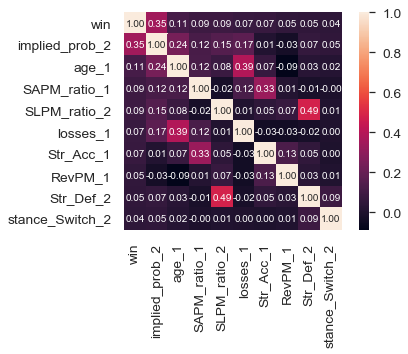

In [63]:
# Subset Correlation Matrix
n = 10 #number of variables for heatmap
corrmat = B.corr()
cols = corrmat.nlargest(n, 'win')['win'].index
cm = np.corrcoef(B[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()

In [64]:
train_set, test_set= np.split(B, [int(.8 *len(B))])

In [65]:
len(train_set)

1026

In [66]:
len(test_set)

257

In [67]:
train_set

,cumultime_1,cumulStr_Att_fighter_1,cumulStr_Att_oponent_1,cumulTD_Att_fighter_1,cumulTD_Att_oponent_1,KDPM_1,KDPM_ratio_1,SLPM_1,SLPM_ratio_1,SAPM_1,SAPM_ratio_1,Str_Acc_1,Str_Def_1,TD_Acc_1,TD_Def_1,SubPM_1,PassPM_1,RevPM_1,Head_SLPM_1,Body_SLPM_1,Leg_SLPM_1,Dist_SLPM_1,Clinch_SLPM_1,Ground_SLPM_1,wins_1,losses_1,implied_prob_1,prev_1,height_1,weight_1,reach_1,age_1,stance_Orthodox_1,stance_Southpaw_1,stance_Switch_1,cumultime_2,cumulStr_Att_fighter_2,cumulStr_Att_oponent_2,cumulTD_Att_fighter_2,cumulTD_Att_oponent_2,KDPM_2,KDPM_ratio_2,SLPM_2,SLPM_ratio_2,SAPM_2,SAPM_ratio_2,Str_Acc_2,Str_Def_2,TD_Acc_2,TD_Def_2,SubPM_2,PassPM_2,RevPM_2,Head_SLPM_2,Body_SLPM_2,Leg_SLPM_2,Dist_SLPM_2,Clinch_SLPM_2,Ground_SLPM_2,wins_2,losses_2,implied_prob_2,prev_2,height_2,weight_2,reach_2,age_2,stance_Orthodox_2,stance_Southpaw_2,stance_Switch_2,win
1277,0.047905,0.044388,0.057662,0.020,0.007692,0.000000,0.000000,0.096232,0.063792,0.154600,0.123282,0.099163,0.096135,0.166667,0.250000,0.098467,0.155306,0.000000,0.040730,0.210570,0.056697,0.082836,0.101855,0.043291,0.043478,0.142857,0.237792,0.033333,0.652174,0.600000,0.791667,0.333333,1.0,0.0,0.0,0.246435,0.153325,0.092497,0.215054,0.091743,0.000000,0.000000,0.114932,0.391076,0.006235,0.009099,0.105797,0.206447,0.100468,0.204545,0.046438,0.187039,0.000000,0.068453,0.178180,0.059257,0.057023,0.072967,0.115191,0.260870,0.066667,0.767624,0.172414,0.590909,0.600000,0.791667,0.28,1.0,0.0,0.0,1.0
832,0.292829,0.324590,0.402382,0.044,0.153846,0.004845,0.000000,0.072457,0.018889,0.183396,0.212230,0.010960,0.021664,0.097222,0.074830,0.012469,0.031054,0.039319,0.062613,0.046159,0.079664,0.127412,0.015118,0.010748,0.086957,0.428571,0.671968,0.200000,0.434783,0.200000,0.375000,0.541667,1.0,0.0,0.0,0.075919,0.031197,0.044193,0.048387,0.036697,0.000000,0.000000,0.060342,0.026655,0.121740,0.251897,0.126700,0.196780,0.122222,0.000000,0.192676,0.030436,0.177698,0.041914,0.023120,0.075269,0.084453,0.020890,0.009912,0.086957,0.200000,0.308204,0.103448,0.500000,0.266667,0.500000,0.16,0.0,0.0,1.0,1.0
1192,0.449045,0.217150,0.128800,0.140,0.430769,0.026006,0.036041,0.110357,0.222910,0.038544,0.020594,0.178295,0.301752,0.201389,0.097076,0.006934,0.036266,0.012694,0.067712,0.110946,0.168288,0.072634,0.103825,0.092051,0.478261,0.357143,0.273761,0.466667,0.695652,0.833333,0.916667,0.708333,1.0,0.0,0.0,0.176541,0.097219,0.210346,0.064516,0.100917,0.120907,0.000000,0.170504,0.079963,0.133481,0.092276,0.156591,0.056647,0.115385,0.229167,0.007356,0.045680,0.000000,0.190813,0.052611,0.020488,0.169895,0.049123,0.108612,0.217391,0.200000,0.725654,0.206897,0.500000,0.986667,0.500000,0.60,1.0,0.0,0.0,1.0
583,0.336634,0.254729,0.178001,0.140,0.115385,0.023807,0.000000,0.154057,0.177880,0.047283,0.012148,0.100064,0.191411,0.225000,0.500000,0.037087,0.116121,0.000000,0.114907,0.116452,0.190152,0.138137,0.059337,0.161950,0.478261,0.071429,0.942067,0.333333,0.695652,0.600000,1.000000,0.208333,1.0,0.0,0.0,0.309801,0.202418,0.139431,0.327957,0.091743,0.000000,0.000000,0.137516,0.186339,0.022221,0.016784,0.111400,0.148413,0.088707,0.310606,0.010621,0.124082,0.005571,0.111062,0.094738,0.091522,0.073310,0.076195,0.138126,0.260870,0.266667,0.039796,0.275862,0.545455,0.600000,0.583333,0.60,0.0,1.0,0.0,0.0
980,0.381438,0.183607,0.253839,0.044,0.369231,0.018020,0.000000,0.094541,0.084999,0.110548,0.103157,0.124308,0.125079,0.220238,0.125397,0.046791,0.038675,0.012774,0.076075,0.055645,0.127567,0.114931,0.048192,0.050796,0.391304,0.357143,0.168367,0.400000,0.608696,0.466667,0.541667,0.375000,1.0,0.0,0.0,0.567785,0.520435,0.547105,0.301075,0.577982,0.011315,0.000000,0.191885,0.229330,0.054060,0.025795,0.064145,0.068276,0.117630,0.113814,0.016381,0.040325,0.013504,0.180642,0.120746,0.065543,0.212520,0.110348,0.069743,0.565217,0.333333,0.652941,0.551724,0.545455,0.466667,0.625000,0.52,1.0,0.0,0.0,1.0
132,0.070407,0.044388,0.067064,0.092,0.046154,0.000000,0.000000,0.071030,0.034901,0.147470,0.081560,0.086458,0.084975,0.062500,0.400000,0.052495

In [68]:
X_train = train_set.iloc[:, 0:-1]
y_train = train_set.loc[:, 'win']
X_test = test_set.iloc[:, 0:-1]
y_test = test_set.loc[:, 'win']

In [119]:
X = X_train.append(X_test)
y = y_train.append(y_test)

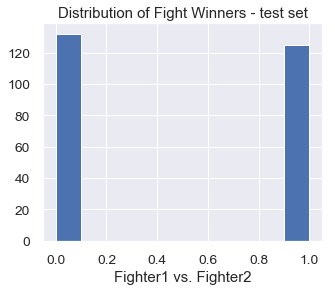

In [69]:
y_test.hist(figsize=(5,4))
plt.title('Distribution of Fight Winners - test set')
plt.xlabel('Fighter1 vs. Fighter2')
plt.savefig('Distribution_Winners.png')

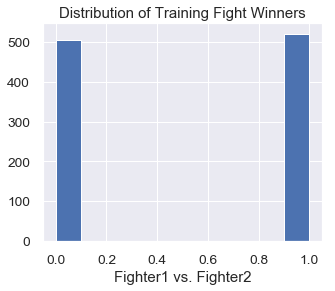

In [70]:
y_train.hist(figsize=(5,4))
plt.title('Distribution of Training Fight Winners')
plt.xlabel('Fighter1 vs. Fighter2')
plt.savefig('Distribution_Train_Winners.png')

In [71]:
#print metrics function
def print_metrics(test, preds):
    print("Precision Score: {}".format(precision_score(test, preds)))
    print("Recall Score: {}".format(recall_score(test, preds)))
    print("Accuracy Score: {}".format(accuracy_score(test, preds)))
    print("F1 Score: {}".format(f1_score(test, preds)))

#function to look at importance of features
def plot_feature_importances(model):
    n_features = X_train.shape[1]
    plt.figure(figsize=(20,20))
    plt.barh(range(n_features), model.feature_importances_, align='center') 
    plt.yticks(np.arange(n_features), X_train.columns.values) 
    plt.xlabel("Feature importance")
    plt.ylabel("Feature")

# Dummy Classifier

In [72]:
# Fitting and training the dummy
dummy = DummyClassifier(strategy='stratified', random_state=20)
dummy.fit(X_train, y_train)

# Dummy predictions
dum_pred = dummy.predict(X_test)

#Printing out results
print_metrics(y_test, dum_pred)

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, dum_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.4830508474576271
Recall Score: 0.456
Accuracy Score: 0.4980544747081712
F1 Score: 0.46913580246913583

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,71,61,132
1.0,68,57,125
All,139,118,257


# Logistic Regression

In [73]:
#logistic regression
logreg = LogisticRegression(fit_intercept = False, C = 1e16, random_state=0)
model_log = logreg.fit(X_train, y_train)
model_log

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1e+16, class_weight=None, dual=False, fit_intercept=False,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=0, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [74]:
y_pred = logreg.predict(X_test)

#Printing out results
print_metrics(y_test, y_pred)

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.6203703703703703
Recall Score: 0.536
Accuracy Score: 0.6147859922178989
F1 Score: 0.5751072961373391

AUC is :0.61

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,91,41,132
1.0,58,67,125
All,149,108,257


Test AUC: 0.6545454545454545
train AUC: 0.7450523555234603


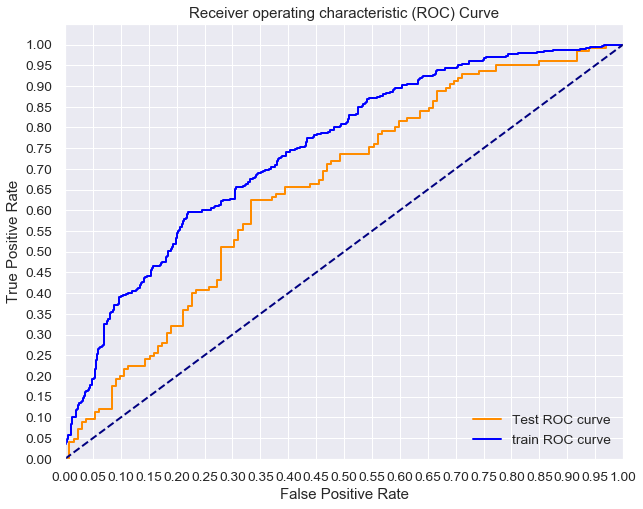

In [75]:
y_test_score = model_log.decision_function(X_test)
y_train_score = model_log.decision_function(X_train)

test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_score)
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_score)

print('Test AUC: {}'.format(auc(test_fpr, test_tpr)))
print('train AUC: {}'.format(auc(train_fpr, train_tpr)))

plt.figure(figsize=(10,8))
lw = 2
plt.plot(test_fpr, test_tpr, color='darkorange',
         lw=lw, label='Test ROC curve')
plt.plot(train_fpr, train_tpr, color='blue',
         lw=lw, label='train ROC curve')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

#  Random Forest

In [76]:
forest = RandomForestClassifier(random_state=20)
forest.fit(X_train, y_train)

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=20, verbose=0,
                       warm_start=False)

In [77]:
y_pred = forest.predict(X_test)

#Printing out results
print_metrics(y_test, y_pred)

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.594059405940594
Recall Score: 0.48
Accuracy Score: 0.5875486381322957
F1 Score: 0.5309734513274336

AUC is :0.58

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,91,41,132
1.0,65,60,125
All,156,101,257


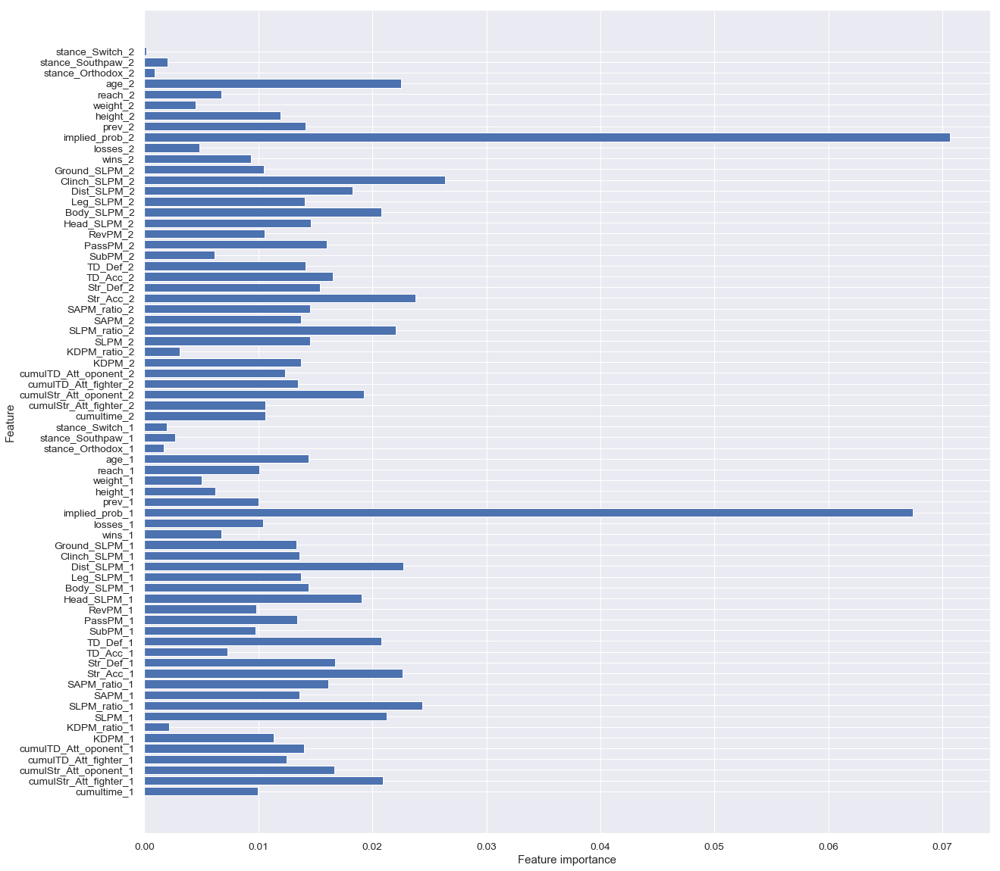

In [78]:
plot_feature_importances(forest)

### Grid Search on RF

In [121]:
#creating grid for grid search for random forest

rf_param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 2, 5, 10, 15, 20],
    'max_features': [None, 2, 10, 15, 20, 30],
    'min_samples_split': [2, 10, 50, 75, 100, 125],
    'min_samples_leaf': [25, 50, 100, 150, 200],
    'n_estimators': [10, 50, 100, 150],
}


rf_grid_search = GridSearchCV(forest, rf_param_grid, cv=3, return_train_score=True, verbose=3)
rf_grid_search.fit(X, y)

Fitting 3 folds for each of 8640 candidates, totalling 25920 fits
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.765, test=0.674), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.778, test=0.600), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.783, test=0.595), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s remaining:    0.0s


[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.800, test=0.646), total=   0.8s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.808, test=0.597), total=   0.8s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.810, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.797, test=0.655), total=   1.3s
[

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.808, test=0.655), total=   1.7s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.826, test=0.595), total=   1.6s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.817, test=0.618), total=   1.8s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.740, test=0.648), total

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.734, test=0.655), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.735, test=0.600), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.745, test=0.618), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.730, test=0.657), t

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.734, test=0.655), total=   1.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.745, test=0.607), total=   1.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.750, test=0.611), total=   1.3s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.704, test=0.653), total

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.732, test=0.650), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.738, test=0.602), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.749, test=0.609), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.737, test=0.653), t

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.693, test=0.622), total=   0.8s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.702, test=0.609), total=   0.8s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.701, test=0.597), total=   1.1s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.670, test=0.674), tot

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.697, test=0.650), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.695, test=0.621), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.696, test=0.588), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.694, test=0.636), t

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.695, test=0.593), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.693, test=0.622), total=   0.8s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.702, test=0.609), total=   1.0s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.701, te

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.648, test=0.625), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.661, test=0.609), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.640, test=0.614), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.651, test=0.627), t

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.634, test=0.618), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.655, test=0.622), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.667, test=0.616), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.636, te

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.632, test=0.629), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.640, test=0.614), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.633, test=0.639), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.632, test=0.629), t

[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.632, test=0.639), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.631, test=0.629), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.648, test=0.611), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.634, test=0.63

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.797, test=0.574), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.814, test=0.621), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.836, test=0.625), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.808, test=0.581), total=   0.1s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.810, test=0.576), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.820, test=0.618), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.722, test=0.641), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.729, test=0.576), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.765, test=0.581), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.766, test=0.583), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.766, test=0.634), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.742, test=0.583), total=   0.1s
[CV] c

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.746, test=0.595), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.749, test=0.614), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.680, test=0.622), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.707, test=0.550), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.724, test=0.607), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.751, test=0.629), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.738, test=0.578), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.748, test=0.604), total=   0.3s
[CV]

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.716, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.641, test=0.597), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.648, test=0.539), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.637, test=0.567), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.669, test=0.590), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.686, test=0.594), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.707, test=0.539), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.702, test=0.600), total=   0.4s
[CV]

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.716, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.614, test=0.569), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.617, test=0.539), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.581, test=0.550), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.656, test=0.608), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.683, test=0.550), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.672, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.669, test=0.620), total=   0.2s
[CV

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.641, test=0.553), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.656, test=0.608), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.683, test=0.550), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.672, test=0.600), total=   0.

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.639, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.536, test=0.517), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.561, test=0.487), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.554, test=0.541), total=   0.0s
[CV] crit

[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.650, test=0.534), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.640, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.663, test=0.608), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.664, test=0.546), total=   0

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.792, test=0.641), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.780, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.805, test=0.635), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.796, test=0.655), total=   0.3s
[CV] cri

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.774, test=0.667), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.777, test=0.593), total=   0.8s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.796, test=0.621), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.732, test=0.627), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.724, test=0.667), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.735, test=0.611), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.743, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.726, test=0.662), total=   0.2s
[CV] criterion=

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.728, test=0.653), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.737, test=0.604), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.755, test=0.616), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.722, test=0.611), total=   0.0s
[CV] 

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.719, test=0.657), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.724, test=0.618), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.730, test=0.614), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.728, test=0.671), total=   0.3s
[

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.674, test=0.643), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.702, test=0.602), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.688, test=0.614), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.660, test=0.611), total=   0.0

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.701, test=0.590), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.681, test=0.614), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.678, test=0.639), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.689, test=0.595), total=

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.680, test=0.607), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.653, test=0.621), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.652, test=0.625), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.654, test=0.595), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.648, test=0.637), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.643, test=0.629), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.668, test=0.593), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.653, test=0.623), total=   0.

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.653, test=0.621), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.591, test=0.580), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.645, test=0.550), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.629, test=0.637), total=   0.0s
[CV] cr

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.665, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.644, test=0.658), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.652, test=0.627), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.671, test=0.616), total=   0

[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.661, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.645, test=0.646), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.651, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.665, test=0.623), total=

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.812, test=0.595), total=   2.7s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.813, test=0.614), total=   0.9s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.776, test=0.653), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.777, test=0.607), total=   0.0s
[CV] cr

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.773, test=0.621), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.751, test=0.660), total=   1.6s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.757, test=0.595), total=   1.0s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.782, test=0.607), total=   1.

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.766, test=0.602), total=   2.4s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.696, test=0.641), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.722, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.730, test=0.583), total=   0.4s
[CV] crite

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.756, test=0.604), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.714, test=0.657), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.743, test=0.607), total=   2.4s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.766, test=0.583), total=   1.0s
[CV]

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.768, test=0.595), total=   2.8s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.670, test=0.608), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.676, test=0.593), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.666, test=0.583), total=   0.2s
[CV] cri

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.685, test=0.623), total=   0.9s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.674, test=0.643), total=   1.0s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.683, test=0.614), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.682, test=0.623), total=   2.

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.686, test=0.628), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.670, test=0.608), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.676, test=0.593), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.666, test=0.583), total=   

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.649, test=0.634), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.672, test=0.611), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.653, test=0.616), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.648, test=0.634), total=   0

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.649, test=0.639), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.667, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.650, test=0.623), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.649, test=0.634), total=  

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.650, test=0.639), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.660, test=0.614), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.645, test=0.651), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.591, test=0.562), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.650, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.664, test=0.604), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.638, test=0.637), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.656, test=0.646), total=   0.1s
[

[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.650, test=0.639), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.660, test=0.614), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.645, test=0.651), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.779, test=0.650), total=   0.

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.790, test=0.653), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.793, test=0.618), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.798, test=0.604), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.801, test=0.664), total=   0.4s
[CV] cri

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.751, test=0.660), total=   1.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.766, test=0.611), total=   1.5s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.776, test=0.630), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.722, test=0.643), total=   0.0

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.730, test=0.662), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.741, test=0.618), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.748, test=0.590), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.731, test=0.648), total=   0.4s
[CV] cri

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.731, test=0.643), total=   1.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.737, test=0.616), total=   4.5s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.757, test=0.609), total=   3.8s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.727, test=0.641), total=   0.4s
[CV

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.671, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.683, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.693, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.670, test=0.636), total=   0.2s
[CV] cri

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.670, test=0.639), total=   1.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.689, test=0.600), total=   2.0s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.692, test=0.623), total=   2.8s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.687, test=0.655), total=   0.1

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.671, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.683, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.693, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.670, test=0.636), total=  

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.651, test=0.632), total=   2.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.671, test=0.618), total=   0.9s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.653, test=0.642), total=   1.6s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.657, test=0.639), total=   0.0

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.653, test=0.639), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.669, test=0.614), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.651, test=0.642), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.651, test=0.636), total=  

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.643, test=0.632), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.657, test=0.616), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.640, test=0.646), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.628, test=0.611), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.646, test=0.650), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.665, test=0.614), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.648, test=0.651), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.645, test=0.641), total=   0.4s
[

[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.643, test=0.632), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.657, test=0.616), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.640, test=0.646), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.788, test=0.641), total=   0.

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.802, test=0.657), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.808, test=0.600), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.819, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.804, test=0.664), total=   0.6s
[CV] cri

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.740, test=0.650), total=   0.7s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.768, test=0.609), total=   0.7s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.782, test=0.595), total=   0.7s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.715, test=0.650), total=   0.0

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.733, test=0.662), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.737, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.746, test=0.585), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.726, test=0.657), total=   0.4s
[CV] cri

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.730, test=0.662), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.750, test=0.611), total=   0.8s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.752, test=0.581), total=   0.7s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.693, test=0.669), total=   0.1s
[CV

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.678, test=0.648), total=   0.7s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.688, test=0.597), total=   0.7s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.675, test=0.614), total=   0.4s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.674, test=0.641), total=   0.6s
[CV] cri

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.670, test=0.629), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.690, test=0.593), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.693, test=0.623), total=   0.6s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.672, test=0.646), total=   0.0

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.678, test=0.648), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.688, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.675, test=0.614), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.674, test=0.641), total=  

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.648, test=0.634), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.667, test=0.611), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.653, test=0.639), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.641, test=0.625), total=   0.0

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.661, test=0.604), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.644, test=0.646), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.645, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.662, test=0.614), total=

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.658, test=0.614), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.631, test=0.635), total=   0.5s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.635, test=0.627), total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.653, test=0.614), total=   0.1s
[CV

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.653, test=0.621), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.634, test=0.639), total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.636, test=0.634), total=   0.2s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.657, test=0.618), total=   0.3s

[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.658, test=0.614), total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.631, test=0.635), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.663, test=0.664), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.662, test=0.595), total=   0.1s
[CV] crit

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.662, test=0.604), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.647, test=0.600), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.665, test=0.636), total=   0.7s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.668, test=0.618), total=   0.6s
[CV] criterio

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.673, test=0.602), total=   0.9s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.644, test=0.609), total=   1.0s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.663, test=0.664), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.662, test=0.595), total=   0.1s
[CV] cr

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.669, test=0.614), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.645, test=0.604), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.659, test=0.634), total=   0.6s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.665, test=0.623), total=   0.5s
[CV] criterio

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.669, test=0.618), total=   0.9s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.643, test=0.609), total=   0.9s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.644, test=0.648), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.664, test=0.607), total=   0.1s
[CV] crite

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.660, test=0.609), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.646, test=0.609), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.663, test=0.636), total=   0.5s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.657, test=0.616), total=   0.5s
[CV] criterio

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.667, test=0.616), total=   0.8s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.641, test=0.611), total=   0.7s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.651, test=0.650), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.664, test=0.604), total=   0.0s
[CV] cr

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.660, test=0.609), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.646, test=0.609), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.663, test=0.636), total=   0.5s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.657, test=0.616), total=   0.5s

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.667, test=0.616), total=   0.6s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.636, test=0.618), total=   0.7s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.655, test=0.627), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.666, test=0.600), total=   0.1s
[CV] cr

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.661, test=0.609), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.640, test=0.614), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.651, test=0.627), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.660, test=0.614), total=   0.4s

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.648, test=0.611), total=   0.6s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.634, test=0.639), total=   0.5s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.632, test=0.632), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.648, test=0.593), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.633, test=0.639), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.632, test=0.629), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.644, test=0.621), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.632, test=0.639), total=   0.3s
[CV]

[CV]  criterion=gini, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.634, test=0.639), total=   0.5s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.653, test=0.601), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.679, test=0.595), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.653, test=0.581), total=   0.0s
[CV] criterion=gini, max_depth=2, max_

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.705, test=0.587), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.725, test=0.555), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.744, test=0.588), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.726, test=0.613), total=   0.2s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.692, test=0.585), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.697, test=0.585), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.715, test=0.564), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.729, test=0.583), total=   0.1s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.688, test=0.534), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.675, test=0.585), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.684, test=0.583), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.724, test=0.553), total=   0.1s
[CV] criterion=gini, max_depth=2, 

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.716, test=0.593), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.628, test=0.590), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.674, test=0.539), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.639, test=0.567), total=   0.0s
[CV] criterion=gini, max_depth

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.690, test=0.585), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.693, test=0.543), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.700, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.692, test=0.627), total=   0.4s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.665, test=0.578), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.690, test=0.585), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.693, test=0.543), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.700, test=0.597), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.641, test=0.553), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.656, test=0.608), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.683, test=0.550), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.672, test=0.600), total=   0.1s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.656, test=0.608), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.683, test=0.550), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.672, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.669, test=0.620), total=   0.1s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.608, test=0.566), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.609, test=0.504), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.603, test=0.553), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.644, test=0.597), total=   0.1s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.664, test=0.546), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.639, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.536, test=0.517), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.561, test=0.487), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.692, test=0.653), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.702, test=0.611), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.704, test=0.614), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.691, test=0.655), total=   0.2s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.689, test=0.607), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.689, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.689, test=0.660), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.700, test=0.611), total=   0.1s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.690, test=0.616), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.680, test=0.634), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.687, test=0.562), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.671, test=0.607), total=   0.0s
[CV] criterion=gini, max_depth=2, m

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.691, test=0.653), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.700, test=0.595), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.694, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.693, test=0.650), total=   0.2s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.697, test=0.590), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.685, test=0.614), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.689, test=0.655), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.704, test=0.593), total=   0.1s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.686, test=0.625), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.648, test=0.611), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.681, test=0.604), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.659, test=0.595), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.673, test=0.641), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.681, test=0.593), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.669, test=0.611), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.666, test=0.650), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.662, test=0.588), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.648, test=0.637), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.643, test=0.629), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.668, test=0.593), total=   0.1s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.653, test=0.621), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.652, test=0.625), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.654, test=0.595), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.644, test=0.632), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.645, test=0.646), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.651, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.665, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.644, test=0.658), total=   0.1s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.645, test=0.646), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.651, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.665, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.644, test=0.658), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.650, test=0.649), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.663, test=0.615), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.701, test=0.590), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.674, test=0.593), total=   0.0s
[CV] criterion=gini, max_depth=2, 

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.689, test=0.604), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.681, test=0.607), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.697, test=0.646), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.700, test=0.607), total=   0.3s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.692, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.675, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.681, test=0.653), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.679, test=0.607), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.700, test=0.604), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.655, test=0.585), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.703, test=0.583), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.673, test=0.618), total=   0.0s
[CV] criterion=gini, max_depth

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.686, test=0.611), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.680, test=0.607), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.684, test=0.646), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.699, test=0.611), total=   0.3s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.672, test=0.607), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.655, test=0.618), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.667, test=0.641), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.679, test=0.604), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.681, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.681, test=0.618), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.651, test=0.599), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.658, test=0.569), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.667, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.650, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.649, test=0.634), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.672, test=0.611), total=   0.2s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.654, test=0.618), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.635, test=0.580), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.665, test=0.569), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.644, test=0.595), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.649, test=0.634), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.672, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.653, test=0.616), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.648, test=0.634), total=   0.4s
[CV] crite

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.638, test=0.637), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.656, test=0.646), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.653, test=0.614), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.643, test=0.644), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.645, test=0.651), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.591, test=0.562), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.633, test=0.567), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.614, test=0.590), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.680, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.688, test=0.621), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.683, test=0.614), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.676, test=0.643), total=   0.3s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.694, test=0.650), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.686, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.671, test=0.614), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.669, test=0.641), total=   0.3s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.688, test=0.607), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.686, test=0.621), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.667, test=0.629), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.676, test=0.597), total=   0.0s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.671, test=0.646), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.681, test=0.611), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.681, test=0.621), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.672, test=0.641), total=   0.5s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.667, test=0.641), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.680, test=0.607), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.655, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.663, test=0.643), total=   0.3s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.676, test=0.630), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.665, test=0.621), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.673, test=0.636), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.676, test=0.616), total=   0.0s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.680, test=0.607), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.655, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.663, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.678, test=0.625), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.653, test=0.642), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.657, test=0.639), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.666, test=0.609), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.666, test=0.630), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.651, test=0.642), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.651, test=0.636), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.669, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.654, test=0.639), total=   0.2s
[CV] criter

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.640, test=0.646), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.628, test=0.611), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.661, test=0.597), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.633, test=0.637), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.645, test=0.641), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.659, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.646, test=0.644), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.643, test=0.632), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.679, test=0.639), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.679, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.665, test=0.618), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.674, test=0.643), total=   0.4s
[CV] criterion=gini, max_depth=2, ma

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.694, test=0.593), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.668, test=0.604), total=   0.5s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.667, test=0.650), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.667, test=0.600), total=   0.0s
[CV] criterion=gini, max_dep

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.668, test=0.623), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.679, test=0.634), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.679, test=0.593), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.675, test=0.616), total=   0.3s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.671, test=0.632), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.673, test=0.607), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.668, test=0.616), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.665, test=0.646), total=   0.4s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.680, test=0.597), total=   0.5s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.669, test=0.602), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.669, test=0.641), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.664, test=0.607), total=   0.0s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.656, test=0.641), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.675, test=0.602), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.671, test=0.614), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.650, test=0.636), total=   0.4s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.655, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.667, test=0.588), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.665, test=0.616), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.656, test=0.641), total=   0.4s
[CV] criterion=

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.648, test=0.634), total=   0.4s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.667, test=0.611), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.653, test=0.639), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.641, test=0.625), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.644, test=0.646), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.645, test=0.636), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.662, test=0.614), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.647, test=0.628), total=   0.3s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.653, test=0.639), total=   0.3s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.635, test=0.627), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.653, test=0.614), total=   0.0s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.633, test=0.642), total=   0.0s
[CV] criterion=gini, max_dep

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.636, test=0.634), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.657, test=0.618), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.631, test=0.637), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.637, test=0.629), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.653, test=0.621), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.634, test=0.639), total=   0.1s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.636, test=0.634), total=   0.2s
[CV] criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.657, test=0.618), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.798, test=0.604), total=   1.7s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.780, test=0.609), total=   1.7s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.742, test=0.685), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.763, test=0.590), total=   0.1s
[CV] criterion

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.742, test=0.593), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.749, test=0.609), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.745, test=0.657), total=   0.9s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.759, test=0.602), total=   1.0s
[CV] c

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.743, test=0.607), total=   1.2s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.754, test=0.607), total=   1.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.700, test=0.655), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.732, test=0.597), total=   0.1s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.739, test=0.604), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.749, test=0.597), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.737, test=0.657), total=   1.1s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.745, test=0.604), total=   0.8s
[CV] criterio

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.736, test=0.611), total=   1.2s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.751, test=0.602), total=   1.2s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.670, test=0.674), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.687, test=0.611), total=   0.2s
[CV] criter

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.695, test=0.621), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.696, test=0.588), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.694, test=0.636), total=   0.6s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.700, test=0.609), total=   0.5s
[CV] c

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.702, test=0.609), total=   0.9s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.701, test=0.597), total=   0.9s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.670, test=0.674), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.687, test=0.611), total=   0.1s


[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.661, test=0.609), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.640, test=0.614), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.651, test=0.627), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.660, test=0.614), total=   0.4s
[CV] c

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.667, test=0.616), total=   0.6s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.636, test=0.618), total=   0.6s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.655, test=0.627), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.666, test=0.600), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.633, test=0.639), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.632, test=0.629), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.644, test=0.621), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.632, test=0.639), total=   0.3s
[CV] criter

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.634, test=0.639), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.632, test=0.632), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.648, test=0.593), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.633, test=0.642), total=   0.0s
[CV] crit

[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.633, test=0.639), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.632, test=0.629), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.644, test=0.621), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.632, test=0.639), total=   0.

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.780, test=0.590), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.793, test=0.607), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.811, test=0.611), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.784, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=5, 

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.775, test=0.625), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.704, test=0.643), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.713, test=0.578), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.701, test=0.590), total=   0.0s
[CV] criterion=gini, max_depth

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.745, test=0.581), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.744, test=0.611), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.748, test=0.625), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.745, test=0.578), total=   0.2s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.730, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.753, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.745, test=0.581), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.744, test=0.611), total=   0.1s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.669, test=0.590), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.686, test=0.594), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.707, test=0.539), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.702, test=0.600), total=   0.1s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.648, test=0.539), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.637, test=0.567), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.676, test=0.587), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.703, test=0.548), total=   0.1s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.669, test=0.620), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.683, test=0.541), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.662, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.614, test=0.569), total=   0.0s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.656, test=0.608), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.683, test=0.550), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.672, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.669, test=0.620), total=   0.1s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.644, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.650, test=0.534), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.640, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.663, test=0.608), total=   0.1s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.608, test=0.566), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.609, test=0.504), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.603, test=0.553), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.644, test=0.597), total=   0.1s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.639, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.756, test=0.653), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.758, test=0.581), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.754, test=0.635), total=   0.0s
[CV] criterion=gini, max_depth=5, m

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.768, test=0.662), total=   0.6s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.776, test=0.567), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.785, test=0.632), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.770, test=0.657), total=   0.4s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.739, test=0.657), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.739, test=0.588), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.751, test=0.614), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.733, test=0.664), total=   0.2s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.741, test=0.600), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.751, test=0.614), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.711, test=0.606), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.707, test=0.576), total=   0.0s
[CV] criterion=gini, max_dep

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.725, test=0.655), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.736, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.744, test=0.621), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.731, test=0.653), total=   0.3s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.701, test=0.590), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.681, test=0.614), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.678, test=0.639), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.689, test=0.595), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.702, test=0.602), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.688, test=0.614), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.660, test=0.611), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.683, test=0.597), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.648, test=0.637), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.643, test=0.629), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.668, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.653, test=0.623), total=   0.1s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.662, test=0.588), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.648, test=0.637), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.643, test=0.629), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.668, test=0.593), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.680, test=0.607), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.653, test=0.621), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.591, test=0.580), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.645, test=0.550), total=   0.0s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.645, test=0.646), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.651, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.665, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.644, test=0.658), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.650, test=0.649), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.591, test=0.580), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.645, test=0.550), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.629, test=0.637), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.767, test=0.648), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.782, test=0.604), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.789, test=0.616), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.779, test=0.650), total=   0.4s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.738, test=0.641), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.752, test=0.609), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.761, test=0.639), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.748, test=0.650), total=   0.3s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.749, test=0.602), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.764, test=0.595), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.686, test=0.653), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.722, test=0.609), total=   0.0s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.745, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.715, test=0.653), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.738, test=0.604), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.762, test=0.585), total=   0.3s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.682, test=0.611), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.685, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.674, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.683, test=0.614), total=   0.3s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.686, test=0.628), total=   1.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.670, test=0.608), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.676, test=0.593), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.666, test=0.583), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.685, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.674, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.683, test=0.614), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.682, test=0.623), total=   0.2s
[CV] criter

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.667, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.650, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.649, test=0.634), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.672, test=0.611), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.682, test=0.625), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.654, test=0.618), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.635, test=0.580), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.665, test=0.569), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.638, test=0.637), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.656, test=0.646), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.653, test=0.614), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.643, test=0.644), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.638, test=0.637), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.656, test=0.646), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.653, test=0.614), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.643, test=0.644), total=   0.1s
[CV] criter

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.767, test=0.653), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.772, test=0.616), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.771, test=0.604), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.758, test=0.650), total=   0.3s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.772, test=0.609), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.777, test=0.614), total=   0.7s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.711, test=0.643), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.724, test=0.600), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.728, test=0.643), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.728, test=0.621), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.751, test=0.604), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.728, test=0.646), total=   0.5s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.730, test=0.657), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.738, test=0.614), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.745, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.728, test=0.643), total=   0.6s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.736, test=0.618), total=   0.7s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.750, test=0.614), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.687, test=0.655), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.682, test=0.621), total=   0.0s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.693, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.670, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.690, test=0.607), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.695, test=0.616), total=   0.5s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.692, test=0.623), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.687, test=0.655), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.682, test=0.621), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.680, test=0.614), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.651, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.669, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.654, test=0.639), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.651, test=0.632), total=   0.3s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.669, test=0.614), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.651, test=0.642), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.651, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.669, test=0.611), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.657, test=0.616), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.640, test=0.646), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.628, test=0.611), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.661, test=0.597), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.648, test=0.651), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.645, test=0.641), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.659, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.646, test=0.644), total=   0.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.640, test=0.646), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.737, test=0.655), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.754, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.754, test=0.560), total=   0.1s
[CV] criterion=gini, max_depth=5, 

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.762, test=0.667), total=   0.7s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.797, test=0.604), total=   0.7s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.782, test=0.597), total=   0.9s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.765, test=0.664), total=   1.1s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.730, test=0.643), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.737, test=0.595), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.736, test=0.581), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.730, test=0.660), total=   0.5s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.742, test=0.618), total=   0.6s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.758, test=0.590), total=   0.7s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.699, test=0.660), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.716, test=0.607), total=   0.0s
[CV] criterion=gini, max_dep

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.746, test=0.590), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.730, test=0.655), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.742, test=0.611), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.750, test=0.585), total=   0.5s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.678, test=0.648), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.688, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.675, test=0.614), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.674, test=0.641), total=   0.7s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.690, test=0.593), total=   0.4s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.693, test=0.623), total=   0.5s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.672, test=0.646), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.664, test=0.597), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.661, test=0.604), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.644, test=0.646), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.645, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.662, test=0.614), total=   0.2s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.653, test=0.639), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.641, test=0.625), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.674, test=0.600), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.650, test=0.607), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.645, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.662, test=0.614), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.647, test=0.628), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.648, test=0.634), total=   0.3s
[CV] crite

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.653, test=0.621), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.634, test=0.639), total=   0.1s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.636, test=0.634), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.657, test=0.618), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.658, test=0.614), total=   0.2s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.631, test=0.635), total=   0.3s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.635, test=0.627), total=   0.0s
[CV] criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.653, test=0.614), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.808, test=0.597), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.810, test=0.604), total=   1.0s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.797, test=0.655), total=   2.1s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.822, test=0.593), total=   2.3s
[CV] c

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.801, test=0.590), total=   1.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.798, test=0.604), total=   1.7s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.714, test=0.671), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.750, test=0.585), total=   0.1s
[CV

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.738, test=0.602), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.749, test=0.609), total=   0.9s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.737, test=0.653), total=   1.0s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.746, test=0.609), total=   1.4s
[CV] criterio

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.745, test=0.607), total=   1.7s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.750, test=0.611), total=   2.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.704, test=0.653), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.732, test=0.597), total=   0.2s
[CV] cr

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.727, test=0.611), total=   1.2s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.743, test=0.597), total=   0.7s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.726, test=0.660), total=   1.6s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.742, test=0.597), total=   1.0s

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.702, test=0.609), total=   1.9s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.701, test=0.597), total=   1.6s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.670, test=0.674), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.687, test=0.611), total=   0.1s


[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.695, test=0.621), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.696, test=0.588), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.694, test=0.636), total=   1.5s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.700, test=0.609), total=

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.667, test=0.616), total=   1.7s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.636, test=0.618), total=   1.9s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.655, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.666, test=0.600), total=   0.1s
[CV

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.661, test=0.609), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.640, test=0.614), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.651, test=0.627), total=   1.0s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.660, test=0.614), total=   1.4s

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.667, test=0.616), total=   1.7s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.636, test=0.618), total=   1.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.632, test=0.632), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.648, test=0.593), total=   0.1s
[

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.640, test=0.614), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.633, test=0.639), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.632, test=0.629), total=   0.8s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.644, test=0.621), total=   0.7s

[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.648, test=0.611), total=   1.3s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.634, test=0.639), total=   0.6s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.632, test=0.632), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.648, test=0.593), total= 

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.794, test=0.576), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.814, test=0.621), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.836, test=0.627), total=   0.6s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.808, test=0.578), total=   0.5s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.800, test=0.616), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.706, test=0.646), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.731, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.723, test=0.600), total=   0.1s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.751, test=0.629), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.738, test=0.578), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.748, test=0.604), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.753, test=0.632), total=   0.5s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.742, test=0.636), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.743, test=0.576), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.724, test=0.607), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.751, test=0.629), total=   0.5s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.746, test=0.578), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.748, test=0.623), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.641, test=0.597), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.648, test=0.539), total=   0.0s
[CV] criterion=gini, max_

[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.686, test=0.594), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.707, test=0.539), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.702, test=0.600), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_l

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.637, test=0.567), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.676, test=0.587), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.703, test=0.548), total=   0.7s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.669, test=0.590), total=   0.4s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.669, test=0.620), total=   0.7s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.683, test=0.541), total=   0.6s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.662, test=0.609), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.614, test=0.569), total=   0.0s
[CV] criterion=gini

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.651, test=0.578), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.643, test=0.522), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.641, test=0.553), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.656, test=0.608), total=   0.4s
[CV] criterion=

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.663, test=0.608), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.664, test=0.546), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.639, test=0.623), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.536, test=0.517), total=   0.1s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.644, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.650, test=0.534), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.640, test=0.623), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.663, test=0.608), total=   0.6s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.788, test=0.636), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.763, test=0.576), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.783, test=0.593), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.792, test=0.641), total=   0.3s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.799, test=0.602), total=   1.0s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.817, test=0.646), total=   1.6s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.793, test=0.662), total=   2.0s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.799, test=0.604), total=   1.6s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.727, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.741, test=0.653), total=   0.6s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.738, test=0.588), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.768, test=0.593), total=   0.6s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.728, test=0.653), total=   0.7s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.737, test=0.604), total=   0.6s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.755, test=0.616), total=   0.6s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.722, test=0.611), total=   0.0s
[CV] criterion=gini

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.724, test=0.667), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.735, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.743, test=0.602), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.726, test=0.662), total=   0.3s
[CV] criterion=

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.674, test=0.643), total=   0.9s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.702, test=0.602), total=   0.9s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.688, test=0.614), total=   1.0s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.660, test=0.611), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.678, test=0.641), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.701, test=0.590), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.681, test=0.614), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.678, test=0.639), total=   0.4s
[CV] criterion=

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.674, test=0.643), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.702, test=0.602), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.688, test=0.614), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.652, test=0.625), total=   0.0s
[CV] crit

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.658, test=0.636), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.662, test=0.588), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.648, test=0.637), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.643, test=0.629), total=   0.4s
[CV] criterion=

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.655, test=0.632), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.680, test=0.607), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.653, test=0.621), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.652, test=0.625), total=   0.0s
[CV] 

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.661, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.645, test=0.646), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.651, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.665, test=0.623), total=   0.3s
[CV] criterio

[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.671, test=0.616), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.650, test=0.649), total=   0.7s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.591, test=0.580), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.645, test=0.550), total=   0.1s
[CV] crite

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.813, test=0.593), total=   0.7s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.813, test=0.621), total=   0.7s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.799, test=0.664), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.819, test=0.611), total=   0.7s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.813, test=0.614), total=   0.8s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.742, test=0.664), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.756, test=0.618), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.759, test=0.616), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.763, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.738, test=0.664), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.749, test=0.588), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.766, test=0.614), total=   0.4s
[CV] criter

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.732, test=0.646), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.743, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.756, test=0.604), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.714, test=0.657), total=   0.3s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.738, test=0.643), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.744, test=0.604), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.766, test=0.602), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.708, test=0.650), total=   0.0s
[CV] criteri

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.671, test=0.650), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.682, test=0.611), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.685, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.674, test=0.643), total=   0.2s
[CV] criterion=

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.676, test=0.641), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.690, test=0.607), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.686, test=0.628), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.670, test=0.608), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.667, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.650, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.649, test=0.634), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.672, test=0.611), total=   0.1s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.682, test=0.625), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.654, test=0.618), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.635, test=0.580), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.665, test=0.569), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.667, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.650, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.649, test=0.634), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.672, test=0.611), total=   0.1s
[CV] c

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.645, test=0.651), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.591, test=0.562), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.633, test=0.567), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.614, test=0.590), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.656, test=0.646), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.653, test=0.614), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.643, test=0.644), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.650, test=0.639), total=   0.2s
[CV

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.790, test=0.653), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.793, test=0.618), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.798, test=0.604), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.801, test=0.664), total=   0.7s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.789, test=0.604), total=   0.7s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.787, test=0.607), total=   0.7s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.730, test=0.655), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.722, test=0.595), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.748, test=0.590), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.731, test=0.648), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.728, test=0.616), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.754, test=0.593), total=   0.4s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.730, test=0.662), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.741, test=0.618), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.748, test=0.590), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.731, test=0.648), total=   0.4s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.725, test=0.648), total=   0.6s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.736, test=0.614), total=   0.7s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.748, test=0.614), total=   0.7s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.687, test=0.655), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.671, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.683, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.693, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.670, test=0.636), total=   0.2s
[CV] criterion=

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.670, test=0.639), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.689, test=0.600), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.692, test=0.623), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.687, test=0.655), total=   0.0s
[CV] 

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.653, test=0.639), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.669, test=0.614), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.651, test=0.642), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.651, test=0.636), total=   0.2s
[CV] criterion=

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.651, test=0.632), total=   3.0s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.671, test=0.618), total=   0.6s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.653, test=0.642), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.657, test=0.639), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.665, test=0.614), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.648, test=0.651), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.645, test=0.641), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.659, test=0.609), total=   0.3s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.657, test=0.616), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.640, test=0.646), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.628, test=0.611), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.661, test=0.597), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.665, test=0.614), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.648, test=0.651), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.645, test=0.641), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.659, test=0.609), total=   0.1s
[CV] c

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.820, test=0.609), total=   0.8s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.828, test=0.597), total=   0.8s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.788, test=0.641), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.784, test=0.602), total=   0.1s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.761, test=0.600), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.769, test=0.588), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.747, test=0.653), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.768, test=0.607), total=   0.4s
[CV] criterio

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.750, test=0.611), total=   3.1s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.752, test=0.581), total=   1.9s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.693, test=0.669), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.711, test=0.607), total=   0.4s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.746, test=0.585), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.726, test=0.657), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.742, test=0.609), total=   0.5s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.751, test=0.593), total=   0.6s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.759, test=0.604), total=   1.0s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.672, test=0.646), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.664, test=0.597), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.673, test=0.604), total=   0.0s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.675, test=0.614), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.674, test=0.641), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.695, test=0.602), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.688, test=0.616), total=   0.3s
[CV] criter

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.693, test=0.623), total=   1.1s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.672, test=0.646), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.664, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.673, test=0.604), total=   0.1s
[CV] crit

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.644, test=0.646), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.645, test=0.636), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.662, test=0.614), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.647, test=0.628), total=   0.2s
[CV] criter

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.653, test=0.639), total=   0.3s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.641, test=0.625), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.674, test=0.600), total=   0.0s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.650, test=0.607), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.636, test=0.634), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.657, test=0.618), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.631, test=0.637), total=   0.2s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.637, test=0.629), total=   0.3s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.653, test=0.621), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.634, test=0.639), total=   0.1s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.636, test=0.634), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.657, test=0.618), total=   0.2s
[CV] criterio

[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.658, test=0.614), total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.631, test=0.635), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.765, test=0.674), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.778, test=0.600), total=   0.1s
[CV] criter

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.808, test=0.597), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.810, test=0.604), total=   0.7s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.797, test=0.655), total=   1.2s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.822, test=0.593), total=   1.5s
[CV] c

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.762, test=0.604), total=   1.3s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.771, test=0.609), total=   1.4s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.704, test=0.667), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.734, test=0.595), total=   0.1s


[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.738, test=0.602), total=   0.5s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.749, test=0.609), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.737, test=0.653), total=   1.5s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.746, test=0.609), total=   1.6s
[CV] c

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.745, test=0.607), total=   2.6s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.750, test=0.611), total=   2.0s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.704, test=0.653), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.732, test=0.597), total=   0.1s
[CV

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.695, test=0.621), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.696, test=0.588), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.694, test=0.636), total=   0.7s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.700, test=0.609), total=   0.6s
[CV] c

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.702, test=0.609), total=   0.9s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.701, test=0.597), total=   0.9s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.670, test=0.674), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.687, test=0.611), total=   0.1s


[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.695, test=0.621), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.696, test=0.588), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.694, test=0.636), total=   0.9s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.700, test=0.609), total=

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.667, test=0.616), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.636, test=0.618), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.655, test=0.627), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.666, test=0.600), total=   0.0s


[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.661, test=0.609), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.640, test=0.614), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.651, test=0.627), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.660, test=0.614), total=

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.648, test=0.611), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.634, test=0.639), total=   0.5s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.632, test=0.632), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.648, test=0.593), total=   0.0s
[CV

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.633, test=0.639), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.632, test=0.629), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.644, test=0.621), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.632, test=0.639), total=   0.

[CV]  criterion=gini, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.634, test=0.639), total=   0.5s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.745, test=0.585), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.731, test=0.553), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.716, test=0.588), total=   0.0s
[CV] criterion=gini, max_depth=

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.836, test=0.625), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.808, test=0.581), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.822, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.841, test=0.620), total=   0.3s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.765, test=0.581), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.766, test=0.583), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.766, test=0.634), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.742, test=0.583), total=   0.1s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.749, test=0.614), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.680, test=0.622), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.707, test=0.550), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.706, test=0.585), total=   0.0s
[CV] criterion=gini, max_depth

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.738, test=0.578), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.748, test=0.604), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.753, test=0.632), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.746, test=0.595), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.686, test=0.594), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.707, test=0.539), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.702, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.703, test=0.634), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.676, test=0.587), total=   0.5s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.703, test=0.548), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.669, test=0.590), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.686, test=0.594), total=   0.3s
[CV] criterion=

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.683, test=0.541), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.662, test=0.609), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.614, test=0.569), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.617, test=0.539), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.641, test=0.553), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.656, test=0.608), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.683, test=0.550), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.672, test=0.600), total=   0.2s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.662, test=0.609), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.536, test=0.517), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.561, test=0.487), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.554, test=0.541), total=   0.0s
[CV] criterion=gini, max_dep

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.644, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.650, test=0.534), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.640, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.663, test=0.608), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.603, test=0.553), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.644, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.650, test=0.534), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.640, test=0.623), total=   0.1s
[CV] criter

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.792, test=0.641), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.780, test=0.602), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.805, test=0.635), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.796, test=0.655), total=   0.5s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.751, test=0.657), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.757, test=0.609), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.777, test=0.625), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.725, test=0.613), total=   0.0s
[CV] criteri

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.735, test=0.611), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.743, test=0.602), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.726, test=0.662), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.738, test=0.609), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.737, test=0.604), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.755, test=0.616), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.722, test=0.611), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.717, test=0.576), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.701, test=0.590), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.681, test=0.614), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.678, test=0.639), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.689, test=0.595), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.702, test=0.602), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.688, test=0.614), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.660, test=0.611), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.683, test=0.597), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.701, test=0.590), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.681, test=0.614), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.678, test=0.639), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.689, test=0.595), total=   0.1s
[CV] c

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.680, test=0.607), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.653, test=0.621), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.652, test=0.625), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.654, test=0.595), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.648, test=0.637), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.643, test=0.629), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.668, test=0.593), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.653, test=0.623), total=   0.1s
[CV]

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.650, test=0.649), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.591, test=0.580), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.645, test=0.550), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.629, test=0.637), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.645, test=0.646), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.651, test=0.643), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.665, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.644, test=0.658), total=   0.1s
[CV] criter

[CV]  criterion=gini, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.650, test=0.649), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.776, test=0.653), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.777, test=0.607), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.784, test=0.600), total=   0.0s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.799, test=0.664), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.819, test=0.611), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.820, test=0.630), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.799, test=0.662), total=   0.5s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.727, test=0.655), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.743, test=0.593), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.763, test=0.611), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.738, test=0.664), total=   0.3s
[CV] criterion=

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.744, test=0.604), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.766, test=0.602), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.696, test=0.641), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.722, test=0.609), total=   0.1s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.756, test=0.604), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.714, test=0.657), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.743, test=0.607), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.766, test=0.583), total=   0.3s
[CV] criter

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.686, test=0.628), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.670, test=0.608), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.676, test=0.593), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.666, test=0.583), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.674, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.683, test=0.614), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.682, test=0.623), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.676, test=0.641), total=   0.3s
[CV] crite

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.667, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.650, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.649, test=0.634), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.672, test=0.611), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.682, test=0.625), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.654, test=0.618), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.635, test=0.580), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.665, test=0.569), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.667, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.650, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.649, test=0.634), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.672, test=0.611), total=   0.3s
[CV] c

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.660, test=0.614), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.645, test=0.651), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.591, test=0.562), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.633, test=0.567), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.656, test=0.646), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.653, test=0.614), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.643, test=0.644), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.650, test=0.639), total=   0.3s
[CV

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.790, test=0.653), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.793, test=0.618), total=   0.8s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.798, test=0.604), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.801, test=0.664), total=   0.6s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.789, test=0.604), total=   0.9s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.787, test=0.607), total=   1.3s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.730, test=0.655), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.722, test=0.595), total=   0.1s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.741, test=0.618), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.748, test=0.590), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.731, test=0.648), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.728, test=0.616), total=   0.4s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.757, test=0.609), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.727, test=0.641), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.706, test=0.604), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.728, test=0.604), total=   0.0s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.730, test=0.623), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.728, test=0.660), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.737, test=0.614), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.757, test=0.607), total=   0.4s
[CV] criter

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.692, test=0.623), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.687, test=0.655), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.682, test=0.621), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.680, test=0.614), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.693, test=0.600), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.670, test=0.636), total=   0.7s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.690, test=0.607), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.695, test=0.616), total=   0.3s
[CV]

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.653, test=0.642), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.657, test=0.639), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.666, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.666, test=0.630), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.651, test=0.642), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.651, test=0.636), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.669, test=0.611), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.654, test=0.639), total=   0.3s
[CV] criter

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.653, test=0.642), total=   1.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.628, test=0.611), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.661, test=0.597), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.633, test=0.637), total=   0.0s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.648, test=0.651), total=   0.5s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.645, test=0.641), total=   1.1s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.659, test=0.609), total=   0.9s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.646, test=0.644), total=   1.1s
[CV] criter

[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.640, test=0.646), total=   1.3s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.628, test=0.611), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.661, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.633, test=0.637), total=   0.1s
[CV] crit

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.819, test=0.597), total=   0.8s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.804, test=0.664), total=   2.1s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.817, test=0.614), total=   1.3s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.824, test=0.604), total=   1.1s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.804, test=0.602), total=   1.0s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.738, test=0.660), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.732, test=0.595), total=   0.1s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.738, test=0.609), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.746, test=0.585), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.726, test=0.657), total=   1.0s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.742, test=0.609), total=   1.0s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.751, test=0.593), total=   0.9s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.733, test=0.662), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.737, test=0.611), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.746, test=0.585), total=   0.5s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.726, test=0.657), total=   0.7s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.717, test=0.657), total=   1.2s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.738, test=0.611), total=   0.8s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.759, test=0.604), total=   1.0s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.672, test=0.646), total=   0.1s
[CV] criterion

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.678, test=0.648), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.688, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.675, test=0.614), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.674, test=0.641), total=   0.5s
[CV] criterion=

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.670, test=0.629), total=   1.1s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.690, test=0.593), total=   0.6s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.693, test=0.623), total=   0.8s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.672, test=0.646), total=   0.0s
[CV] 

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.649, test=0.632), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.661, test=0.604), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.644, test=0.646), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.645, test=0.636), total=   0.4s
[CV] criterion=

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.648, test=0.634), total=   0.5s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.667, test=0.611), total=   1.2s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.653, test=0.639), total=   0.5s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.641, test=0.625), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.653, test=0.621), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.634, test=0.639), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.636, test=0.634), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.657, test=0.618), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.658, test=0.614), total=   0.5s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.631, test=0.635), total=   0.4s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.635, test=0.627), total=   0.0s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.653, test=0.614), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.634, test=0.639), total=   0.2s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.636, test=0.634), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.657, test=0.618), total=   0.3s
[CV] criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.631, test=0.637), total=   0.2s
[CV]

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.817, test=0.618), total=   3.9s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.765, test=0.674), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.778, test=0.600), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.783, test=0.595), total=   0.4s
[CV] crit

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.757, test=0.595), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.754, test=0.655), total=   1.2s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.764, test=0.609), total=   1.6s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.770, test=0.611), total=   1.

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.750, test=0.611), total=   2.4s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.704, test=0.653), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.732, test=0.597), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.755, test=0.588), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.749, test=0.609), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.737, test=0.653), total=   1.9s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.746, test=0.609), total=   2.9s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.758, test=0.602), total=   2.8s
[CV]

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.750, test=0.602), total=   2.8s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.670, test=0.674), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.687, test=0.611), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.688, test=0.574), total=   0.1s
[CV] cri

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.696, test=0.588), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.694, test=0.636), total=   0.8s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.700, test=0.609), total=   0.8s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.695, test=0.593), total=   1.

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.701, test=0.597), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.670, test=0.674), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.687, test=0.611), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.688, test=0.574), total=   

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.640, test=0.614), total=   0.7s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.651, test=0.627), total=   1.1s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.660, test=0.614), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.634, test=0.618), total=   0.

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.636, test=0.618), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.655, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.666, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.643, test=0.609), total=   0

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.633, test=0.639), total=   0.8s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.632, test=0.629), total=   2.0s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.644, test=0.621), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.632, test=0.639), total=   1.7s
[CV]

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.634, test=0.639), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.632, test=0.632), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.648, test=0.593), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.633, test=0.642), total=   0.0s
[C

[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.633, test=0.639), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.632, test=0.629), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.644, test=0.621), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.632, test=0.639), tota

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.827, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.797, test=0.574), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.814, test=0.621), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.836, test=0.625), total=   0.1s
[CV] criterion=gini, max_dept

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.770, test=0.583), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.794, test=0.618), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.718, test=0.657), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.728, test=0.569), total=   0.0s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.724, test=0.607), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.751, test=0.629), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.738, test=0.578), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.748, test=0.604), total=   0.3s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.743, test=0.576), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.724, test=0.607), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.751, test=0.629), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.738, test=0.578), total=   0.1s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.716, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.641, test=0.597), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.648, test=0.539), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.637, test=0.567), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.686, test=0.594), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.707, test=0.539), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.702, test=0.600), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.703, test=0.634), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.641, test=0.553), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.656, test=0.608), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.683, test=0.550), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.672, test=0.600), total=   0.1s
[CV] criterion=gini, max_

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.581, test=0.550), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.651, test=0.578), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.643, test=0.522), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.641, test=0.553), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.669, test=0.620), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.683, test=0.541), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.662, test=0.609), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.536, test=0.517), total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.644, test=0.597), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.650, test=0.534), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.640, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.663, test=0.608), total=   0.1s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.608, test=0.566), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.609, test=0.504), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.603, test=0.553), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.644, test=0.597), total=   0.1s
[CV] criterion=

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.799, test=0.604), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.815, test=0.621), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.788, test=0.636), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.763, test=0.576), total=   0.0s
[CV] criterion=gini, 

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.778, test=0.618), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.756, test=0.664), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.759, test=0.609), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.779, test=0.602), total=   0.6s
[CV] criter

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.755, test=0.616), total=   0.8s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.722, test=0.611), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.717, test=0.576), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.731, test=0.614), total=   0.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.726, test=0.662), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.738, test=0.609), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.751, test=0.611), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.728, test=0.653), total=   1.1s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.701, test=0.590), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.681, test=0.614), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.678, test=0.639), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.689, test=0.595), total=   0.2s
[CV] criterion=gini,

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.702, test=0.602), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.688, test=0.614), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.660, test=0.611), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.683, test=0.597), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.701, test=0.590), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.681, test=0.614), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.678, test=0.639), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.689, test=0.595), total=   0.2s
[CV] c

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.680, test=0.607), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.653, test=0.621), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.652, test=0.625), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.654, test=0.595), total=   0.0s
[CV] criterion

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.662, test=0.588), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.648, test=0.637), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.643, test=0.629), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.668, test=0.593), total=   0.2s
[CV] c

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.671, test=0.616), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.650, test=0.649), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.591, test=0.580), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.645, test=0.550), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.645, test=0.646), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.651, test=0.643), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.665, test=0.623), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.644, test=0.658), total=   0.2s
[CV] criter

[CV]  criterion=gini, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.650, test=0.649), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.776, test=0.653), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.777, test=0.607), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.784, test=0.600), total=   0.1s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.799, test=0.664), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.819, test=0.611), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.820, test=0.630), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.799, test=0.662), total=   0.5s
[CV] criterion=gi

[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.738, test=0.574), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.727, test=0.655), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.743, test=0.593), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.766, test=0.583), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.738, test=0.643), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.744, test=0.604), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.766, test=0.602), total=   0.5s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.732, test=0.646), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.743, test=0.602), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.756, test=0.604), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.714, test=0.657), total=   1.0s
[CV] criterion=

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.676, test=0.641), total=   0.8s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.690, test=0.607), total=   0.8s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.686, test=0.628), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.670, test=0.608), total=   0.1s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.671, test=0.650), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.682, test=0.611), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.685, test=0.623), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.674, test=0.643), total=   0.4s
[CV] criterion=

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.676, test=0.641), total=   1.0s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.690, test=0.607), total=   1.2s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.686, test=0.628), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.635, test=0.580), total=   0.0s
[CV] crit

[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.667, test=0.623), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.650, test=0.623), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.649, test=0.634), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_sampl

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.682, test=0.625), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.654, test=0.618), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.635, test=0.580), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.665, test=0.569), total=   0.0s
[CV] cr

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.664, test=0.604), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.638, test=0.637), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.656, test=0.646), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.653, test=0.614), total=   0.3s
[CV] criterio

[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.660, test=0.614), total=   3.7s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.645, test=0.651), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.591, test=0.562), total=   0.0s
[CV] criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.633, test=0.567), total=   0.0s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.793, test=0.618), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.798, test=0.604), total=   0.7s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.801, test=0.664), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.796, test=0.609), total=   1.0s
[CV] criterion=gini, max_de

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.815, test=0.609), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.752, test=0.653), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.754, test=0.578), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.746, test=0.588), total=   0.1s
[CV] criterion=gini, ma

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.749, test=0.621), total=   0.7s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.734, test=0.639), total=   1.0s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.732, test=0.602), total=   0.8s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.769, test=0.616), total=   0.7s
[CV] criter

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.706, test=0.604), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.728, test=0.604), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.730, test=0.662), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.741, test=0.618), total=   0.6s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.728, test=0.616), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.754, test=0.593), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.731, test=0.643), total=   1.6s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.737, test=0.616), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.680, test=0.614), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.671, test=0.643), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.683, test=0.609), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.693, test=0.600), total=   0.5s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.695, test=0.616), total=   0.8s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.670, test=0.639), total=   1.0s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.689, test=0.600), total=   1.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.692, test=0.623), total=   0.8s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.653, test=0.639), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.669, test=0.614), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.651, test=0.642), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.651, test=0.636), total=   0.3s
[CV] criterion=gini, m

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.651, test=0.632), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.671, test=0.618), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.653, test=0.642), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.657, test=0.639), total=   0.0s
[CV] criteri

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.653, test=0.639), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.669, test=0.614), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.651, test=0.642), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.651, test=0.636), total=   0.6s
[CV] cri

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.643, test=0.632), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.657, test=0.616), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.640, test=0.646), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.628, test=0.611), total=   0.0s
[CV] criteri

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.665, test=0.614), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.648, test=0.651), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.645, test=0.641), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.659, test=0.609), total=   0.2s
[CV] c

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.820, test=0.609), total=   2.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.828, test=0.597), total=   1.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.788, test=0.641), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.784, test=0.602), total=   0.1s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.794, test=0.609), total=   0.7s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.752, test=0.662), total=   1.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.790, test=0.607), total=   1.0s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.803, test=0.609), total=   0.6s
[CV] criterion=gin

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.766, test=0.585), total=   2.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.693, test=0.669), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.711, test=0.607), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.723, test=0.595), total=   0.3s
[CV] criterion=gini, max_dep

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.726, test=0.657), total=   1.6s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.742, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.751, test=0.593), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.730, test=0.662), total=   2.3s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.721, test=0.653), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.725, test=0.597), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.736, test=0.597), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.711, test=0.655), total=   1.2s
[CV] criterion=

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.670, test=0.629), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.690, test=0.593), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.693, test=0.623), total=   1.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.672, test=0.646), total=   0.2s
[CV] criteri

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.678, test=0.648), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.688, test=0.597), total=   0.7s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.675, test=0.614), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.674, test=0.641), total=   1.2s
[CV] cri

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.648, test=0.634), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.667, test=0.611), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.653, test=0.639), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.641, test=0.625), total=   0.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.649, test=0.632), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.661, test=0.604), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.644, test=0.646), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.645, test=0.636), total=   0.2s
[CV] criterion=

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.648, test=0.634), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.667, test=0.611), total=   0.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.653, test=0.639), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.635, test=0.627), total=   0.0s
[CV] crit

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.650, test=0.632), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.653, test=0.621), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.634, test=0.639), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.636, test=0.634), total=   0.2s
[CV] criterion=

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.658, test=0.614), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.631, test=0.635), total=   0.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.635, test=0.627), total=   0.1s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.653, test=0.614), total=   0.0s
[CV] cr

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.814, test=0.597), total=   1.0s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.818, test=0.614), total=   1.5s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.808, test=0.662), total=   2.4s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.824

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.781, test=0.660), total=   2.9s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.797, test=0.588), total=   2.3s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.803, test=0.604), total=   2.5s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.731, test=0.660), total=   0.7s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.739, test=0.600), total=   0.8s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.751, test=0.604), total=   0.7s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.732, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.757, test=0.588), total=   1.2s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.741, test=0.657), total=   2.0s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.744, test=0.602), total=   2.1s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.723, test=0.607), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.739, test=0.581), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.714, test=0.662), total=   0.7s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.690, test=0.646), total=   0.7s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.704, test=0.616), total=   0.7s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.699, test=0.588), total=   0.8s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(t

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.702, test=0.595), total=   1.9s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.674, test=0.657), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.687, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(t

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.652, test=0.616), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.640, test=0.614), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.652, test=0.627), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.660

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.657, test=0.620), total=   0.8s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.671, test=0.621), total=   0.8s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.636, test=0.618), total=   0.9s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(tra

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.649, test=0.622), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.652, test=0.616), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.640, test=0.614), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.633, test=0.639), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.631, test=0.629), total=   0.8s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.648, test=0.607), total=   0.9s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(t

[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.632, test=0.629), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.640, test=0.614), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.633, test=0.639), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.834, test=0.629), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.804, test=0.576), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.829, test=0.609), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.747, test=0.594), total=   0

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.772, test=0.576), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.790, test=0.630), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.802, test=0.629), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.791, test=0.585), total=

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.778, test=0.615), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.757, test=0.569), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.768, test=0.604), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.680, test=0.615), to

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.745, test=0.585), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.728, test=0.604), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.759, test=0.627), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.739, test=0.569), total=

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.749, test=0.576), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.749, test=0.602), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.692, test=0.604), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.683, test=0.569), 

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.703, test=0.546), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.671, test=0.590), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.686, test=0.594), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.710, test=0.543),

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.700, test=0.625), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.707, test=0.567), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.713, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.641, test=0.59

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.643, test=0.522), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.641, test=0.553), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.653, test=0.608), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.683, test=0.550), total=

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.669, test=0.620), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.683, test=0.541), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.659, test=0.609), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.614, test=0.569)

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.651, test=0.578), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.643, test=0.522), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.641, test=0.553), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.653, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.643, test=0.623), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.663, test=0.608), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.664, test=0.546), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.641, test=0.62

[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.603, test=0.553), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.644, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.650, test=0.534), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, 

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.813, test=0.604), total=   0.8s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.817, test=0.632), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.799, test=0.660), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.777, test=0.593), tot

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.758, test=0.657), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.773, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.786, test=0.609), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.772, test=0.660), t

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.772, test=0.609), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.740, test=0.664), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.754, test=0.602), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.773, te

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.727, test=0.650), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.739, test=0.585), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.745, test=0.602), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.728, test=0.664), t

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.754, test=0.600), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.728, test=0.657), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.742, test=0.604), total=   0.8s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.763, te

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.681, test=0.648), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.706, test=0.597), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.682, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.677, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.674, test=0.623), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.674, test=0.650), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.700, test=0.593), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.692, te

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.664, test=0.583), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.650, test=0.639), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.646, test=0.629), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.672, test=0.597),

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.652, test=0.629), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.683, test=0.607), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.657, test=0.618), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.655, test

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.663, test=0.639), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.664, test=0.583), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.650, test=0.639), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.646, 

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.645, test=0.658), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.652, test=0.627), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.669, test=0.607), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.647, te

[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.645, test=0.646), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.651, test=0.643), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.665, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.6

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.813, test=0.583), total=   0.9s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.829, test=0.590), total=   0.7s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.778, test=0.650), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.784, test=0.583), tot

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.772, test=0.657), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.785, test=0.607), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.803, test=0.616), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.778, test=0.676), t

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.765, test=0.623), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.748, test=0.650), total=   1.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.761, test=0.583), total=   0.9s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.772, te

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.734, test=0.643), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.749, test=0.590), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.749, test=0.593), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.726, test=0.653), t

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.765, test=0.583), total=   0.7s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.737, test=0.641), total=   1.0s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.748, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.763, te

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.676, test=0.609), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.673, test=0.604), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.673, test=0.650), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.686, test=0.60

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.677, test=0.639), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.685, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.688, test=0.618), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.684, te

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.692, test=0.628), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.648, test=0.576), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.665, test=0.569), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.644, test=0.595), 

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.647, test=0.623), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.650, test=0.634), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.672, test=0.614), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.653, tes

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.682, test=0.611), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.655, test=0.616), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.648, test=0.576), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.665,

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.638, test=0.637), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.656, test=0.646), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.661, test=0.614), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.643, tes

[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.662, test=0.616), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.645, test=0.651), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.591, test=0.562), total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.633, te

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.802, test=0.667), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.820, test=0.630), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.807, test=0.590), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.803, test=0.667), total=  

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.807, test=0.667), total=   1.0s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.811, test=0.607), total=   1.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.825, test=0.590), total=   1.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.748, test=0.648)

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.751, test=0.657), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.757, test=0.607), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.757, test=0.614), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.727, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.759, test=0.614), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.735, test=0.650), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.741, test=0.614), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.758, test=0.60

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.730, test=0.604), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.737, test=0.657), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.738, test=0.614), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.744, test=0.61

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.689, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.694, test=0.611), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.672, test=0.641), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.687, test=0.59

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.677, test=0.636), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.687, test=0.604), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.683, test=0.611), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.670, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.694, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.672, test=0.641), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.687, test=0.597), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.653, test=0.639), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.666, test=0.618), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.652, test=0.642), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.651, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.657, test=0.642), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.648, test=0.632), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.671, test=0.616), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.666, test=0.614), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.648, test=0.651), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.645, test=0.641), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.659, test=

[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.643, test=0.632), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.657, test=0.616), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.640, test=0.646), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.628, te

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.800, test=0.641), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.821, test=0.628), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.808, test=0.604), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.804, test=0.657), total=  

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.807, test=0.660), total=   1.7s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.828, test=0.616), total=   1.8s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.828, test=0.607), total=   1.5s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.748, test=0.674)

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.745, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.739, test=0.657), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.738, test=0.597), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.759, test=0.60

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.751, test=0.602), total=   0.8s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.757, test=0.595), total=   0.8s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.727, test=0.667), total=   1.0s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.751, test=0.61

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.728, test=0.671), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.738, test=0.604), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.750, test=0.590), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.730, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.686, test=0.621), total=   0.7s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.677, test=0.636), total=   0.9s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.689, test=0.595), total=   1.1s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.683, test=0.62

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.684, test=0.648), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.690, test=0.593), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.679, test=0.616), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.677, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.686, test=0.621), total=   0.7s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.677, test=0.636), total=   0.7s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.689, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.651, test=0.632), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.664, test=0.604), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.644, test=0.646), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.645, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.647, test=0.628), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.648, test=0.629), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.668, test=0.614), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.650, test=0.632), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.654, test=0.621), total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.631, test=0.639), total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.641, test=0.

[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.637, test=0.632), total=   0.4s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.657, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.633, test=0.635), total=   0.6s
[CV] criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.635, te

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.665, test=0.639), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.655, test=0.614), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.644, test=0.607), total=   0.7s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.671, test=0.636), total=   1.1s
[

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.678, test=0.641), total=   1.5s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.667, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.643, test=0.611), total=   1.5s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.645, test=0.660), total

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.665, test=0.639), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.655, test=0.614), total=   0.6s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.644, test=0.607), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.671, test=0.636), t

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.659, test=0.629), total=   2.0s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.662, test=0.623), total=   1.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.646, test=0.609), total=   1.7s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.655, test=0.678), total

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.660, test=0.632), total=   0.7s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.672, test=0.611), total=   0.7s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.643, test=0.607), total=   0.7s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.662, test=0.634), t

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.650, test=0.629), total=   0.9s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.665, test=0.611), total=   1.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.641, test=0.609), total=   1.9s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.652, test=0.650), tot

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.655, test=0.634), total=   0.6s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.665, test=0.621), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.643, test=0.607), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.664, test=0.636), t

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.644, test=0.607), total=   1.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.650, test=0.629), total=   1.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.665, test=0.611), total=   1.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.641, te

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.643, test=0.609), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.649, test=0.622), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.652, test=0.616), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.640, test=0.614), tot

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.660, test=0.621), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.634, test=0.618), total=   0.7s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.657, test=0.620), total=   0.8s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.671, te

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.633, test=0.642), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.632, test=0.629), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.640, test=0.614), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.633, test=0.639), tot

[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.641, test=0.618), total=   0.7s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.633, test=0.639), total=   0.7s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.631, test=0.629), total=   0.8s
[CV] criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.648, test=0.60

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.707, test=0.567), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.700, test=0.580), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.717, test=0.546), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.741, test=0.590), total=   0.1s
[CV] criterion=ent

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.732, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.651, test=0.597), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.682, test=0.604), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.647, test=0.585), total=   0.0s
[CV] criterion=e

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.713, test=0.560), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.724, test=0.583), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.705, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.721, test=0.548), total=   0.4s
[CV

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.657, test=0.578), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.681, test=0.597), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.694, test=0.529), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.675, test=0.585), total=   0.2s
[CV] criterion=en

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.721, test=0.595), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.696, test=0.601), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.723, test=0.574), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.713, test=0.588), total=   0.3s
[CV

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.661, test=0.576), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.690, test=0.585), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.693, test=0.550), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.703, test=0.602), total=   0.1s
[CV]

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.624, test=0.592), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.643, test=0.543), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.617, test=0.593), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.659, test=0.604), total=   0.1s
[CV

[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.683, test=0.550), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.672, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.669, test=0.620), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.641, test=0.553), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.653, test=0.608), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.683, test=0.550), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.672, test=0.600), total=   0.1s
[CV]

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.659, test=0.609), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.536, test=0.517), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.561, test=0.487), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.554, test=0.541), total=   0.0s
[CV] criterion

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.644, test=0.597), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.650, test=0.534), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.643, test=0.623), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.663, test=0.608), total=   0.2s
[CV

[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.608, test=0.566), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.609, test=0.504), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.603, test=0.553), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.644, test=0.597), total=   0.1s
[

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.698, test=0.646), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.709, test=0.602), total=   0.6s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.710, test=0.625), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.666, test=0.639), total=   0.0s
[CV] 

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.689, test=0.641), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.689, test=0.604), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.690, test=0.607), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.693, test=0.655), total=   0.2s
[

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.689, test=0.655), total=   0.8s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.716, test=0.600), total=   1.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.693, test=0.614), total=   1.0s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.674, test=0.641), total=   0.2s
[CV] crite

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.692, test=0.643), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.702, test=0.585), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.679, test=0.595), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.693, test=0.650), total=   0.7s
[CV] cri

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.690, test=0.660), total=   0.7s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.723, test=0.590), total=   0.6s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.686, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.648, test=0.611), total=   0.1s


[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.678, test=0.646), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.695, test=0.595), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.671, test=0.607), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.670, test=0.641), total=   0.7s
[

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.674, test=0.653), total=   1.3s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.699, test=0.583), total=   0.9s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.687, test=0.621), total=   1.0s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.648, test=0.611), total

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.663, test=0.639), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.664, test=0.583), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.650, test=0.639), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.646, test=0.629), total=   0.8s
[

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.652, test=0.629), total=   1.0s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.683, test=0.607), total=   1.0s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.657, test=0.618), total=   1.0s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.655, test=0.622), total=   0

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.661, test=0.609), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.645, test=0.646), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.651, test=0.643), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.665, test=0.611), total=   0.3s
[CV] c

[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.669, test=0.607), total=   0.7s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.647, test=0.649), total=   0.8s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.591, test=0.580), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.645, test=0.550), total=   0.1s


[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.661, test=0.609), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.645, test=0.646), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.651, test=0.643), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.665, test=0.611), total=

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.703, test=0.607), total=   1.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.690, test=0.618), total=   1.4s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.666, test=0.604), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.700, test=0.602), total=   0.1s
[CV] cr

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.696, test=0.590), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.671, test=0.604), total=   0.6s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.703, test=0.667), total=   1.7s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.693, test=0.597), total=   1.2s

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.706, test=0.609), total=   1.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.697, test=0.607), total=   1.0s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.655, test=0.590), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.706, test=0.602), total=   0.1s
[CV] crite

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.693, test=0.595), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.669, test=0.604), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.686, test=0.653), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.696, test=0.614), total=   0.6s
[CV] c

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.704, test=0.611), total=   1.4s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.689, test=0.609), total=   1.6s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.651, test=0.599), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.658, test=0.569), total=   0.1s
[CV]

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.678, test=0.604), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.668, test=0.616), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.677, test=0.641), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.681, test=0.597), total=   0.7s

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.688, test=0.618), total=   1.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.682, test=0.618), total=   1.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.651, test=0.599), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.658, test=0.569), total= 

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.669, test=0.621), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.647, test=0.623), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.650, test=0.634), total=   0.8s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.672, test=0.614), total=   0.8s

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.682, test=0.611), total=   1.3s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.655, test=0.616), total=   1.6s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.648, test=0.576), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.665, test=0.569), total=   0

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.664, test=0.604), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.638, test=0.637), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.656, test=0.646), total=   0.6s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.661, test=0.614), total=   0.8s
[CV] c

[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.662, test=0.616), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.645, test=0.651), total=   0.6s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.591, test=0.562), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.633, test=0.567), total=   0.0s


[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.638, test=0.637), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.656, test=0.646), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.661, test=0.614), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.643, test=0.644), tota

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.687, test=0.628), total=   0.8s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.672, test=0.650), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.682, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.652, test=0.600), total=   0.1s
[CV] crit

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.673, test=0.616), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.677, test=0.646), total=   0.6s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.688, test=0.614), total=   0.6s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.676, test=0.621), total=   0.

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.683, test=0.618), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.666, test=0.622), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.676, test=0.597), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.647, test=0.600), total=   0.1s
[CV] crite

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.652, test=0.604), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.673, test=0.653), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.688, test=0.614), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.673, test=0.623), total=   0.5s
[CV]

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.680, test=0.621), total=   0.7s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.679, test=0.639), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.676, test=0.616), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.664, test=0.607), total=   0.0s
[CV] cri

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.654, test=0.616), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.665, test=0.648), total=   0.6s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.678, test=0.628), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.664, test=0.611), total=   0.

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.665, test=0.616), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.679, test=0.639), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.676, test=0.616), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.664, test=0.607), total=   

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.652, test=0.642), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.651, test=0.636), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.672, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.657, test=0.642), total=   0.

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.654, test=0.644), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.657, test=0.639), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.666, test=0.609), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.666, test=0.630), total=   0

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.645, test=0.641), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.659, test=0.609), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.645, test=0.644), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.643, test=0.632), total=   0.3s
[CV

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.666, test=0.614), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.648, test=0.651), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.645, test=0.641), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.659, test=0.609), total=   0.2s

[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.657, test=0.616), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.640, test=0.646), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.665, test=0.650), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.664, test=0.597), total=   0.1s
[CV] 

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.682, test=0.593), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.661, test=0.621), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.685, test=0.650), total=   1.1s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.689, test=0.600), total=   0.5s
[CV] c

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.694, test=0.597), total=   1.1s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.666, test=0.609), total=   1.1s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.665, test=0.632), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.664, test=0.590), total=   0.2s


[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.673, test=0.604), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.662, test=0.621), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.670, test=0.646), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.681, test=0.607), total=   0.5s
[CV] c

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.680, test=0.602), total=   0.7s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.669, test=0.607), total=   0.9s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.664, test=0.653), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.666, test=0.593), total=   0.1s
[CV

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.660, test=0.609), total=   0.2s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.655, test=0.641), total=   0.6s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.679, test=0.597), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.668, test=0.609), total=   0.7s
[CV]

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.674, test=0.611), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.671, test=0.650), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.676, test=0.602), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.653, test=0.600), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.655, test=0.641), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.679, test=0.597), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.668, test=0.609), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.656, test=0.639), tot

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.672, test=0.597), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.650, test=0.604), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.651, test=0.632), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.664, test=0.604), total=   0.3s
[CV

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.664, test=0.618), total=   0.5s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.647, test=0.628), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.648, test=0.629), total=   0.6s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.668, test=0.614), tot

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.654, test=0.621), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.631, test=0.639), total=   0.1s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.641, test=0.634), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.662, test=0.621), total=   0.2s

[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.657, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.633, test=0.635), total=   0.4s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.635, test=0.627), total=   0.0s
[CV] criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=2, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.653, test=0.614), total=   0

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.786, test=0.607), total=   1.2s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.778, test=0.614), total=   1.0s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.774, test=0.667), total=   2.6s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.784, test=0.607), total=   1.9s

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.798, test=0.593), total=   3.9s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.786, test=0.611), total=   3.1s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.734, test=0.681), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.752, test=0.611), total= 

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.744, test=0.616), total=   1.3s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.751, test=0.618), total=   1.0s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.726, test=0.669), total=   2.3s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.746, test=0.611),

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.742, test=0.600), total=   2.0s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.762, test=0.602), total=   2.3s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.698, test=0.653), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.732, test=0.602), total= 

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.739, test=0.600), total=   0.7s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.749, test=0.604), total=   1.0s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.730, test=0.655), total=   1.9s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.745, test=0.604),

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.700, test=0.616), total=   1.5s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.702, test=0.595), total=   2.3s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.674, test=0.657), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.687, test=0.611), tot

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.697, test=0.657), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.701, test=0.614), total=   1.3s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.696, test=0.595), total=   1.1s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.690, test=0.646), t

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.699, test=0.588), total=   1.3s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.696, test=0.636), total=   1.4s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.700, test=0.616), total=   1.7s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.702, te

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.649, test=0.622), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.652, test=0.616), total=   0.7s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.640, test=0.614), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.652, test=0.627), t

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.634, test=0.618), total=   0.7s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.657, test=0.620), total=   1.6s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.671, test=0.621), total=   1.6s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.636, te

[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.633, test=0.642), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.632, test=0.629), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.640, test=0.614), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=5,

[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.641, test=0.618), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.633, test=0.639), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.631, test=0.629), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.648, test=0.60

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.780, test=0.576), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.791, test=0.616), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.809, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.786, test=0.578), total=   0.3s
[CV] criterion=entro

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.792, test=0.597), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.799, test=0.607), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.714, test=0.622), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.717, test=0.574), total=   0.1s
[CV] criterion

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.750, test=0.593), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.748, test=0.590), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.761, test=0.622), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.741, test=0.583), total=   0.3s
[CV] c

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.746, test=0.581), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.742, test=0.611), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.680, test=0.629), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.694, test=0.553), total=   0.0s
[CV] criterion

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.746, test=0.581), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.730, test=0.614), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.747, test=0.625), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.741, test=0.585), total=   0.2s
[CV] c

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.707, test=0.567), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.713, test=0.600), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.641, test=0.597), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.648, test=0.539), total=   0.1s
[CV] crite

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.703, test=0.546), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.671, test=0.590), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.686, test=0.594), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.710, test=0.543), total=   0.1s
[CV] c

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.707, test=0.567), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.713, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.614, test=0.569), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.617, test=0.539), total=   0.0s
[CV] cri

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.643, test=0.522), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.641, test=0.553), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.653, test=0.608), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.683, test=0.550), total=   0.2s
[CV] c

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.683, test=0.541), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.659, test=0.609), total=   0.7s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.614, test=0.569), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.617, test=0.539), total=   0.1s


[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.644, test=0.597), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.650, test=0.534), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.643, test=0.623), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.663, test=0.608), total=   0.3s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.609, test=0.504), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.603, test=0.553), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.644, test=0.597), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.650, test=0.534), total=   0.2s

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.783, test=0.600), total=   1.6s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.787, test=0.621), total=   2.0s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.759, test=0.660), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.748, test=0.604), total=   0.2s
[CV] crite

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.761, test=0.604), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.750, test=0.609), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.756, test=0.653), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.759, test=0.597), total=   0.4s
[CV] c

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.752, test=0.597), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.764, test=0.625), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.715, test=0.629), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.714, test=0.590), total=   0.0s
[CV] cri

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.725, test=0.593), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.738, test=0.625), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.724, test=0.660), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.737, test=0.604), total=   0.3s
[CV] c

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.743, test=0.597), total=   0.7s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.757, test=0.621), total=   0.7s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.710, test=0.636), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.715, test=0.588), total=   0.0s


[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.706, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.682, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.677, test=0.643), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.697, test=0.590), total=   0.2s

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.700, test=0.593), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.692, test=0.611), total=   0.7s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.660, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.693, test=0.597), total=   0

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.650, test=0.639), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.646, test=0.629), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.672, test=0.597), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.653, test=0.618), total=   0.2s
[CV]

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.657, test=0.618), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.655, test=0.622), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.651, test=0.600), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.644, test=0.632), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.646, test=0.629), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.672, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.653, test=0.618), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.652, test=0.629), tot

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.646, test=0.643), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.661, test=0.609), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.645, test=0.646), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.651, test=0.643), total=   0.3s
[

[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.652, test=0.627), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.669, test=0.607), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.647, test=0.649), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.591, test=0.580), total

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.777, test=0.611), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.752, test=0.662), total=   1.3s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.777, test=0.590), total=   1.9s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.784, test=0.625), total=   1.1s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.727, test=0.653), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.745, test=0.593), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.745, test=0.593), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.724, test=0.660), total=   1.2s
[CV] criterion=

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.733, test=0.646), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.751, test=0.602), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.759, test=0.595), total=   0.9s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.699, test=0.641), total=   0.0s
[CV] 

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.722, test=0.662), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.730, test=0.590), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.743, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.711, test=0.646), total=   0.7s
[

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.684, test=0.643), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.695, test=0.607), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.692, test=0.628), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.670, test=0.608), total=   0.0

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.673, test=0.650), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.686, test=0.609), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.686, test=0.623), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.677, test=0.639), total=  

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.650, test=0.634), total=   1.8s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.682, test=0.611), total=   1.3s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.655, test=0.616), total=   1.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.648, test=0.576), total=   0.1s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.650, test=0.639), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.669, test=0.621), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.647, test=0.623), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.650, test=0.634), total=   0.3s
[

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.650, test=0.634), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.682, test=0.611), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.655, test=0.616), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.591, test=0.562), total=   

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.650, test=0.643), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.664, test=0.604), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.638, test=0.637), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.656, test=0.646), total=   0.5s
[

[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.650, test=0.639), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.662, test=0.616), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.645, test=0.651), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.591, test=0.562), total

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.772, test=0.657), total=   1.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.758, test=0.621), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.773, test=0.602), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.769, test=0.657), total=   0.8s
[CV] cri

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.755, test=0.648), total=   0.9s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.777, test=0.614), total=   0.9s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.771, test=0.616), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.727, test=0.660), total=   0.1s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.740, test=0.655), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.737, test=0.614), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.744, test=0.614), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.735, test=0.655), total=   0.8s
[CV] criterion=

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.733, test=0.655), total=   0.7s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.738, test=0.611), total=   1.0s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.755, test=0.604), total=   1.0s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.712, test=0.625), total=   0.1s
[CV] 

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.734, test=0.664), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.737, test=0.614), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.727, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.731, test=0.674), total=   0.6s
[

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.672, test=0.641), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.687, test=0.597), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.685, test=0.618), total=   0.7s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.687, test=0.653), total=   0.1

[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.677, test=0.636), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.687, test=0.604), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.683, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_f

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.657, test=0.642), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.648, test=0.632), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.671, test=0.616), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.654, test=0.644), total=   0.6s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.653, test=0.639), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.666, test=0.618), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.652, test=0.642), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.651, test=0.636), total=   0.3s
[

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.648, test=0.632), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.671, test=0.616), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.654, test=0.644), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.628, test=0.611), total=   

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.666, test=0.614), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.648, test=0.651), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.645, test=0.641), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.659, test=0.609), total=   0.2s

[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.657, test=0.616), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.640, test=0.646), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.628, test=0.611), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.661, test=0.597), total= 

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.777, test=0.611), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.782, test=0.604), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.763, test=0.662), total=   1.0s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.800, test=0.604), total=   1.0s
[CV] c

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.778, test=0.614), total=   1.4s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.780, test=0.595), total=   1.3s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.710, test=0.660), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.742, test=0.590), total=   0.1s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.732, test=0.607), total=   0.9s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.744, test=0.593), total=   0.7s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.725, test=0.653), total=   1.2s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.745, test=0.604), total=   1.1s
[CV] criterio

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.750, test=0.614), total=   1.0s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.757, test=0.593), total=   1.3s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.705, test=0.655), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.713, test=0.602), total=   0.1s
[CV] cr

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.731, test=0.604), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.741, test=0.593), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.707, test=0.655), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.735, test=0.604), total=   0.7s

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.689, test=0.595), total=   0.8s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.683, test=0.621), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.679, test=0.648), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.664, test=0.593), total=   0.0s


[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.690, test=0.593), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.679, test=0.616), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.677, test=0.636), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.694, test=0.607), total=

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.668, test=0.614), total=   0.5s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.650, test=0.637), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.641, test=0.625), total=   0.1s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.672, test=0.597), total=   0.1s
[CV

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.664, test=0.604), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.644, test=0.646), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.645, test=0.636), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.664, test=0.618), total=   0.6s

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.668, test=0.614), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.650, test=0.637), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.635, test=0.627), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.653, test=0.614), total=   0.0s
[

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.654, test=0.621), total=   0.3s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.631, test=0.639), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.641, test=0.634), total=   0.2s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.662, test=0.621), total=   0.2s

[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.657, test=0.611), total=   0.4s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.633, test=0.635), total=   0.6s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.635, test=0.627), total=   0.0s
[CV] criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=5, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.653, test=0.614), total= 

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.814, test=0.597), total=   1.2s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.818, test=0.614), total=   1.6s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.808, test=0.662), total=   2.1s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.824, test=0.595),

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.781, test=0.660), total=   3.8s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.797, test=0.588), total=   3.8s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.803, test=0.604), total=   7.8s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.740, test=0.66

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.731, test=0.660), total=   0.8s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.739, test=0.600), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.751, test=0.604), total=   0.7s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.732, test=0.653), total=  

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.741, test=0.657), total=   2.2s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.744, test=0.602), total=   3.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.765, test=0.607), total=   2.9s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.713, test=0.655)

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.714, test=0.662), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.736, test=0.597), total=   0.8s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.745, test=0.600), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.727, test=0.

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.699, test=0.588), total=   1.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.696, test=0.636), total=   2.1s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.700, test=0.616), total=   1.9s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.702, te

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.687, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.688, test=0.574), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.697, test=0.657), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.701, te

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.652, test=0.627), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.660, test=0.621), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.634, test=0.618), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.657, test=0.62

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.636, test=0.618), total=   0.9s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.657, test=0.629), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.666, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.643, test=0.6

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.652, test=0.616), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.640, test=0.614), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.652, test=0.627), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.660

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.631, test=0.629), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.648, test=0.607), total=   0.7s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.632, test=0.639), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.632, test

[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.632, test=0.629), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.640, test=0.614), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.633, test=0.639), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.632, 

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.828, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.836, test=0.629), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.803, test=0.574), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.829, test=0.604), total=   0.2s
[CV] crite

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.790, test=0.630), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.802, test=0.627), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.791, test=0.585), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.803, test=0.590), total=   0.2s
[CV]

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.768, test=0.604), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.680, test=0.615), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.701, test=0.550), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.707, test=0.588), total=   0.0s
[CV] criterion

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.728, test=0.604), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.759, test=0.627), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.739, test=0.569), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.749, test=0.597), total=   0.1s
[CV]

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.749, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.692, test=0.604), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.683, test=0.569), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.686, test=0.590), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.671, test=0.590), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.686, test=0.594), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.710, test=0.543), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.702, test=0.581), total=   0.

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.713, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.641, test=0.597), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.648, test=0.539), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.623, test=0.569), total=   0

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=50, score=(train=0.641, test=0.553), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.653, test=0.608), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.683, test=0.550), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.672, test=0.600), total=   0.1s
[CV]

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.659, test=0.609), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.614, test=0.569), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.617, test=0.539), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.581, test=0.550), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.641, test=0.553), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.653, test=0.608), total=   0.7s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.683, test=0.550), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.672, test=0.600), tota

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.641, test=0.623), total=   0.7s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.536, test=0.517), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.561, test=0.487), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.554, test=0.541), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.603, test=0.553), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.644, test=0.597), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.650, test=0.534), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=2, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.643, test=0.623), tota

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.814, test=0.632), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.799, test=0.660), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.777, test=0.593), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.775, test=0.632), total=   0.0s
[CV

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.786, test=0.609), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.772, test=0.660), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.783, test=0.600), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.793, test=0.623), total=   0.

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.773, test=0.616), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.717, test=0.632), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.723, test=0.585), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.706, test=0.616), total=   0.0s
[CV] cr

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.745, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.728, test=0.664), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.744, test=0.600), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.754, test=0.600), total=   0.

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.763, test=0.607), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.711, test=0.636), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.711, test=0.590), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.701, test=0.625), total=   

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.677, test=0.643), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.697, test=0.590), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.674, test=0.623), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.674, test=0.650), tot

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.681, test=0.648), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.706, test=0.597), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.682, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.677, test=0.643), t

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.652, test=0.629), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.683, test=0.607), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.657, test=0.618), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.655, test=0.622), total=   0

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.664, test=0.583), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.650, test=0.639), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.646, test=0.629), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.672, test=0.597), total=

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.652, test=0.629), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.683, test=0.607), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.657, test=0.618), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.591, test=0.580), to

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.645, test=0.646), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.651, test=0.643), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.665, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.645, test=0.658), tota

[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.645, test=0.550), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.629, test=0.637), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.646, test=0.643), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.661, test=0.609), tot

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.810, test=0.588), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.831, test=0.628), total=   0.7s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.814, test=0.671), total=   1.3s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.813, test=0.583), total=   0

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.755, test=0.667), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.765, test=0.585), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.772, test=0.604), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.762, test=0.664), total=  

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.737, test=0.641), total=   0.8s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.748, test=0.590), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.763, test=0.588), total=   0.7s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.699, test=0.643), total=   0.1s
[CV

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.734, test=0.643), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.749, test=0.590), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.749, test=0.593), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.726, test=0.653), total=   0.4s
[

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.721, test=0.653), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.748, test=0.593), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.769, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.670, test=0.608), total= 

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.673, test=0.650), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.686, test=0.609), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.686, test=0.623), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.677, test=0.639), total=  

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.684, test=0.643), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.695, test=0.607), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.692, test=0.628), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.670, test=0.608)

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.647, test=0.623), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.650, test=0.634), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.672, test=0.614), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.653, test=0.616), tota

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.655, test=0.616), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.648, test=0.576), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.665, test=0.569), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.644, test=0.595), tot

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.638, test=0.637), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.656, test=0.646), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.661, test=0.614), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.643, test=0.644), total=   0.

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.591, test=0.562), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.633, test=0.567), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.614, test=0.590), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.650, test=0.643), total=   0

[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.656, test=0.646), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.661, test=0.614), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.643, test=0.644), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.650, test=0.63

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.802, test=0.667), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.824, test=0.630), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.807, test=0.590), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.803, test=0.664), total=   0.6s
[

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.756, test=0.660), total=   1.6s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.773, test=0.611), total=   1.8s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.786, test=0.623), total=   0.9s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.730, test=0.662), total

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.737, test=0.657), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.738, test=0.614), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.744, test=0.614), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.739, test=0.662), total=   0.5s
[

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.735, test=0.650), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.741, test=0.614), total=   0.7s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.758, test=0.609), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.720, test=0.646), total=   0

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.677, test=0.636), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.687, test=0.604), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.683, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.670, test=0.643), total=   0.4s
[

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.672, test=0.641), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.687, test=0.597), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.685, test=0.618), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.687, test=0.653), total

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.677, test=0.636), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.687, test=0.604), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.683, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.670, test=0.643), t

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.648, test=0.632), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.671, test=0.616), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.654, test=0.644), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.657, test=0.639), total

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.666, test=0.618), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.652, test=0.642), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.651, test=0.636), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.672, test=0.611),

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.657, test=0.616), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.640, test=0.646), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.628, test=0.611), total=   0.0s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.661, test=0.597), total=   0

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.666, test=0.614), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.648, test=0.651), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.645, test=0.641), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.659, test=0.609), total=

[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.643, test=0.632), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.657, test=0.616), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.640, test=0.646), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.785, test=0.664), tota

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.800, test=0.641), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.821, test=0.628), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.808, test=0.604), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.804, test=0.657), total=   0.7s
[

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.749, test=0.660), total=   1.0s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.778, test=0.611), total=   0.9s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.779, test=0.607), total=   0.9s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.710, test=0.669), total

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.728, test=0.671), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.738, test=0.604), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.750, test=0.590), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.730, test=0.660), total=   0.5s
[

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.727, test=0.667), total=   0.7s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.751, test=0.614), total=   0.8s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.762, test=0.585), total=   0.8s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.710, test=0.664), total=   0

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.684, test=0.648), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.690, test=0.593), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.679, test=0.616), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.677, test=0.636), total=   0.4s
[

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.677, test=0.636), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.689, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.683, test=0.621), total=   0.6s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.679, test=0.648), total

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.684, test=0.648), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.690, test=0.593), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.679, test=0.616), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.677, test=0.636), t

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.648, test=0.629), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.668, test=0.614), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.650, test=0.637), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.641, test=0.625), total

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.651, test=0.632), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.664, test=0.604), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.644, test=0.646), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.645, test=0.636), t

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.637, test=0.632), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.657, test=0.611), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.633, test=0.635), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.635, test=0.627), total=   0

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.654, test=0.621), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.631, test=0.639), total=   0.1s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.641, test=0.634), total=   0.2s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.662, test=0.621), total=

[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.637, test=0.632), total=   0.4s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.657, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=10, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.633, test=0.635), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.778, test=0.657), 

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.804, test=0.657), total=   0.8s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.814, test=0.597), total=   0.8s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.818, test=0.614), total=   0.8s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.808, test=0.662), t

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.778, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.760, test=0.657), total=   2.0s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.770, test=0.595), total=   1.8s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.783, te

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.737, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.755, test=0.585), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.731, test=0.660), total=   0.6s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.739, test=0.600), tot

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.732, test=0.653), total=   1.1s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.748, test=0.600), total=   1.1s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.757, test=0.588), total=   1.0s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.741, test=0.65

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.748, test=0.602), total=   1.5s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.674, test=0.657), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.687, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.688, test=0.574), t

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.701, test=0.614), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.696, test=0.595), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.690, test=0.646), total=   0.7s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.704, test=

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.696, test=0.636), total=   1.1s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.700, test=0.616), total=   1.0s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.702, test=0.595), total=   1.1s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.67

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.649, test=0.622), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.652, test=0.616), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.640, test=0.614), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.652, test=0.

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.634, test=0.618), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.657, test=0.620), total=   0.6s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.671, test=0.621), total=   0.8s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.636, te

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.632, test=0.629), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.640, test=0.614), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.633, test=0.639), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.632, test=0.629), t

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.633, test=0.639), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.631, test=0.629), total=   0.6s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.648, test=0.607), total=   0.6s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.632, te

[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.632, test=0.629), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.640, test=0.614), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=50, score=(train=0.633, test=0.639), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=None, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.632, 

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.834, test=0.629), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.804, test=0.576), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=150, score=(train=0.829, test=0.609), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=50, n_estimators=10, score=(train=0.747, test=0.594), total=   0.0s
[CV] 

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.769, test=0.593), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=50, score=(train=0.775, test=0.616), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.785, test=0.620), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=100, score=(train=0.769, test=0.576), total=   0.1s

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.749, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.680, test=0.615), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.701, test=0.550), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=10, n_estimators=10, score=(train=0.707, test=0.588), total=   0.0s
[CV] crite

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.728, test=0.604), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.759, test=0.627), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.739, test=0.569), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.749, test=0.597), total=   0.1s
[CV]

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.750, test=0.621), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.641, test=0.597), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.648, test=0.539), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.623, test=0.569), total=   0.0s
[CV] cri

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.671, test=0.590), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.686, test=0.594), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.710, test=0.543), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.702, test=0.581), total=   0.

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.713, test=0.600), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.641, test=0.597), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.648, test=0.539), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.623, test=0.569), total=   

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.641, test=0.553), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.653, test=0.608), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.683, test=0.550), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.672, test=0.600), total=   0.

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.617, test=0.539), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.581, test=0.550), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.651, test=0.578), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.643, test=0.522), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.643, test=0.623), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.663, test=0.608), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.664, test=0.546), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.641, test=0.623), total=   0.1s
[CV

[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.644, test=0.597), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.650, test=0.534), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.643, test=0.623), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.663, test=0.608), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.775, test=0.632), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.796, test=0.662), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.797, test=0.590), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.804, test=0.614), total=   0.2s
[CV] crite

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.819, test=0.632), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.808, test=0.657), total=   0.9s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.813, test=0.604), total=   0.6s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.817, test=0.632), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.737, test=0.641), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.743, test=0.590), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.761, test=0.597), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.744, test=0.653), total=  

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.728, test=0.657), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.742, test=0.604), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.763, test=0.607), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.717, test=0.632), total=   0.0

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.727, test=0.650), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.739, test=0.585), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.745, test=0.602), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.728, test=0.664), total=  

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.674, test=0.650), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.700, test=0.593), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.692, test=0.611), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.660, test=0.611), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.706, test=0.597), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=50, score=(train=0.682, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.677, test=0.643), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.697, test=0.590), total=

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.674, test=0.650), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.700, test=0.593), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.692, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.655, test=0.622), to

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.664, test=0.583), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=50, score=(train=0.650, test=0.639), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.646, test=0.629), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.672, test=0.597), total=

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.683, test=0.607), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=150, score=(train=0.657, test=0.618), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.655, test=0.622), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=150, min_samples_split=125, n_estimators=10, score=(train=0.651, test=0.600), 

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=50, score=(train=0.645, test=0.646), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.651, test=0.643), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.665, test=0.611), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=100, score=(train=0.645, test=0.658), tota

[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=150, score=(train=0.647, test=0.649), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.591, test=0.580), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.645, test=0.550), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=10, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.629, test=0.637), tot

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=50, score=(train=0.818, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.807, test=0.667), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.810, test=0.588), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=100, score=(train=0.831, test=0.628), total=   0.5s
[CV]

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=150, score=(train=0.829, test=0.590), total=   0.7s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.752, test=0.678), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.748, test=0.600), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=75, n_estimators=10, score=(train=0.769, test=0.593), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=50, score=(train=0.766, test=0.618), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.746, test=0.660), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.752, test=0.595), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=100, score=(train=0.765, test=0.623), tota

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=150, score=(train=0.763, test=0.588), total=   0.6s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.699, test=0.643), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.735, test=0.604), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=50, n_estimators=10, score=(train=0.731, test=0.595), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=50, score=(train=0.749, test=0.593), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.726, test=0.653), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.745, test=0.595), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=100, score=(train=0.765, test=0.583), tota

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=150, score=(train=0.692, test=0.628), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.670, test=0.608), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.676, test=0.609), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=10, n_estimators=10, score=(train=0.673, test=0.604), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.677, test=0.639), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.685, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=100, score=(train=0.688, test=0.618), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.684, test=0.643), tot

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=150, score=(train=0.692, test=0.628), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.648, test=0.576), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.665, test=0.569), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=2, n_estimators=10, score=(train=0.644, test=0.595), total=   0.0s


[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.650, test=0.634), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.672, test=0.614), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=100, score=(train=0.653, test=0.616), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=150, score=(train=0.650, test=0.634), tot

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.669, test=0.621), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=50, score=(train=0.647, test=0.623), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.650, test=0.634), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.672, test=0.614),

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.662, test=0.616), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=150, score=(train=0.645, test=0.651), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.591, test=0.562), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=50, n_estimators=10, score=(train=0.633, test=0.567), total= 

[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=50, score=(train=0.638, test=0.637), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.656, test=0.646), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.661, test=0.614), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=15, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.643, test=0.644

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=150, score=(train=0.825, test=0.590), total=   0.9s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.769, test=0.662), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.784, test=0.607), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=10, n_estimators=10, score=(train=0.779, test=0.581), total=   0.1s
[CV

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=50, score=(train=0.789, test=0.604), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.765, test=0.671), total=   0.6s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.783, test=0.611), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=75, n_estimators=100, score=(train=0.794, test=0.609), total=   0.

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=150, score=(train=0.771, test=0.618), total=   0.7s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.720, test=0.646), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.711, test=0.611), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=2, n_estimators=10, score=(train=0.730, test=0.604), total=   0.0s
[CV] cr

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=50, score=(train=0.744, test=0.614), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.739, test=0.662), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.738, test=0.618), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=0.759, test=0.614), total=   0.

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=150, score=(train=0.758, test=0.609), total=   0.6s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.721, test=0.634), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.715, test=0.611), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=50, min_samples_split=125, n_estimators=10, score=(train=0.717, test=0.597), total=   

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=50, score=(train=0.683, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.670, test=0.643), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.689, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.694, test=0.611), tota

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=150, score=(train=0.685, test=0.618), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.687, test=0.653), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.681, test=0.621), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.686, test=0.611), tot

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.651, test=0.636), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.672, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.657, test=0.642), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.648, test=0.632), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.653, test=0.639), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.666, test=0.618), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.652, test=0.642), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.651, test=0.636), total=  

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.648, test=0.632), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.671, test=0.616), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.654, test=0.644), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.628, test=0.611), to

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.666, test=0.614), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.648, test=0.651), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.645, test=0.641), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.659, test=0.609), total=

[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.657, test=0.616), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.640, test=0.646), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.628, test=0.611), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.661, test=0.597), 

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.821, test=0.628), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.808, test=0.604), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.804, test=0.657), total=   0.7s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.829, test=0.616), total=   0.8s

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.803, test=0.611), total=   1.1s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.798, test=0.593), total=   1.1s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.717, test=0.674), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.745, test=0.595), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.738, test=0.604), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.750, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.730, test=0.660), total=   0.7s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.751, test=0.602), total=   0.7s
[CV] c

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.751, test=0.614), total=   1.4s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.762, test=0.585), total=   1.3s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.710, test=0.664), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.704, test=0.602), total=   0.1s


[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.731, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.741, test=0.585), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.710, test=0.660), total=   0.6s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.738, test=0.600), total=

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.689, test=0.595), total=   0.7s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.683, test=0.621), total=   0.9s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.679, test=0.648), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=10, score=(train=0.664, test=0.593), total= 

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.690, test=0.593), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.679, test=0.616), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.677, test=0.636), total=   0.7s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=100, score=(train=0.694, test=0.607),

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.668, test=0.614), total=   0.6s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.650, test=0.637), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.641, test=0.625), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=10, score=(train=0.672, test=0.597), total=   0

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.644, test=0.646), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.645, test=0.636), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.664, test=0.618), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=75, n_estimators=100, score=(train=0.647, test=0.628), tota

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.668, test=0.614), total=   0.5s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.650, test=0.637), total=   0.9s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.635, test=0.627), total=   0.1s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=10, score=(train=0.653, test=0.614), total=  

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.654, test=0.621), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.631, test=0.639), total=   0.2s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.641, test=0.634), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.662, test=0.621), total=

[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.657, test=0.611), total=   0.4s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.633, test=0.635), total=   0.3s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.635, test=0.627), total=   0.0s
[CV] criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=15, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=10, score=(train=0.653, test=0.614), 

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.814, test=0.597), total=   1.2s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.818, test=0.614), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.808, test=0.662), total=   2.1s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.824, test=0.595),

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.781, test=0.660), total=   3.7s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.797, test=0.588), total=   3.1s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.803, test=0.604), total=   3.6s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.740, test=0.66

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.731, test=0.660), total=   0.7s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.739, test=0.600), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=50, score=(train=0.751, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.732, test=0.653), total=  

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.741, test=0.657), total=   1.9s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.744, test=0.602), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=0.765, test=0.607), total=   1.9s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=75, n_estimators=10, score=(train=0.713, test=0.655)

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.714, test=0.662), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.736, test=0.597), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=50, score=(train=0.745, test=0.600), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=50, min_samples_split=125, n_estimators=100, score=(train=0.727, test=0.

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=100, score=(train=0.699, test=0.588), total=   0.8s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.696, test=0.636), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.700, test=0.616), total=   1.2s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=10, n_estimators=150, score=(train=0.702, te

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.688, test=0.574), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.697, test=0.657), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.701, test=0.614), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=100, min_samples_split=100, n_estimators=50, score=(train=0.696, te

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.660, test=0.621), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=100, score=(train=0.634, test=0.618), total=   0.8s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.657, test=0.620), total=   0.8s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=2, n_estimators=150, score=(train=0.671, test=0.62

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=10, score=(train=0.643, test=0.609), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.649, test=0.622), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.652, test=0.616), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=75, n_estimators=50, score=(train=0.640, test=0.61

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.660, test=0.621), total=   0.7s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=100, score=(train=0.634, test=0.618), total=   0.7s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.657, test=0.620), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=150, min_samples_split=125, n_estimators=150, score=(train=0.

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.632, test=0.629), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.640, test=0.614), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=50, score=(train=0.633, test=0.639), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=0.632, test=0.

[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=100, score=(train=0.633, test=0.639), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.631, test=0.629), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.648, test=0.607), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=None, min_samples_leaf=200, min_samples_split=100, n_estimators=150, score=(train=0.

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.782, test=0.578), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=50, score=(train=0.817, test=0.600), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.824, test=0.625), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=10, n_estimators=100, score=(train=0.807, test=0.576), total=   0.2s
[CV] c

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.794, test=0.590), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=75, n_estimators=150, score=(train=0.811, test=0.604), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.721, test=0.632), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=25, min_samples_split=100, n_estimators=10, score=(train=0.728, test=0.593), total=   0.1s
[CV

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.759, test=0.627), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.739, test=0.569), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=100, score=(train=0.749, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=2, n_estimators=150, score=(train=0.756, test=0.629), total=   0.2s
[CV] crite

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.745, test=0.585), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=50, score=(train=0.728, test=0.604), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.759, test=0.627), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=75, n_estimators=100, score=(train=0.739, test=0.569), total=   0.2s
[CV] c

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.746, test=0.574), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=50, min_samples_split=125, n_estimators=150, score=(train=0.750, test=0.621), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.641, test=0.597), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=2, n_estimators=10, score=(train=0.648, test=0.539), total=   0.0s
[CV]

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=50, score=(train=0.671, test=0.590), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.686, test=0.594), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.710, test=0.543), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=0.702, test=0.581), total=   0.

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=100, n_estimators=150, score=(train=0.713, test=0.600), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.641, test=0.597), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.648, test=0.539), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=100, min_samples_split=125, n_estimators=10, score=(train=0.623, test=0.569), total=   

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=50, score=(train=0.641, test=0.553), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.653, test=0.608), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.683, test=0.550), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=10, n_estimators=100, score=(train=0.672, test=0.600), total=   0.

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=75, n_estimators=150, score=(train=0.659, test=0.609), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.614, test=0.569), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.617, test=0.539), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=150, min_samples_split=100, n_estimators=10, score=(train=0.581, test=0.550), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=50, score=(train=0.603, test=0.553), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.644, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.650, test=0.534), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=2, n_estimators=100, score=(train=0.643, test=0.623), total=   0.2s
[CV]

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=50, n_estimators=150, score=(train=0.641, test=0.623), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.536, test=0.517), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.561, test=0.487), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=75, n_estimators=10, score=(train=0.554, test=0.541), total=   0.0s
[C

[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.650, test=0.534), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=100, score=(train=0.643, test=0.623), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.663, test=0.608), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=2, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.664, test=0.546), tot

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.796, test=0.662), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.797, test=0.590), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.804, test=0.614), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.806, test=0.667), total=   0.5s
[

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.758, test=0.660), total=   1.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.764, test=0.604), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.776, test=0.614), total=   1.0s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.714, test=0.627), total

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.727, test=0.650), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.739, test=0.585), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.745, test=0.602), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.728, test=0.664), total=   0.5s
[

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.728, test=0.657), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.742, test=0.604), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.763, test=0.607), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.717, test=0.632), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.681, test=0.648), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.706, test=0.597), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.682, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.677, test=0.643), total=   0.2s
[

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.674, test=0.650), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.700, test=0.593), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.692, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.660, test=0.611), total

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.681, test=0.648), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.706, test=0.597), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.682, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.677, test=0.643), t

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.652, test=0.629), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.683, test=0.607), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.657, test=0.618), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.655, test=0.622), total

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.664, test=0.583), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.650, test=0.639), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.646, test=0.629), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.672, test=0.597),

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.669, test=0.607), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.647, test=0.649), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.591, test=0.580), total=   0.0s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.645, test=0.550), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.661, test=0.609), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.645, test=0.646), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.651, test=0.643), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.665, test=0.611), total=

[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.652, test=0.627), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.669, test=0.607), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=10, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.647, test=0.649), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.778, test=0.650), tota

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.794, test=0.664), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.806, test=0.583), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.818, test=0.611), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.807, test=0.667), total=   0.5s
[

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.765, test=0.657), total=   0.7s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.765, test=0.588), total=   0.7s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.778, test=0.611), total=   0.8s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.719, test=0.664), total

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.734, test=0.643), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.749, test=0.590), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.749, test=0.593), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.726, test=0.653), total=   0.8s
[

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.737, test=0.641), total=   1.9s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.748, test=0.590), total=   1.6s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.763, test=0.588), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.699, test=0.643), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.673, test=0.650), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.686, test=0.609), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.686, test=0.623), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.677, test=0.639), total=   0.4s
[

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.684, test=0.643), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.695, test=0.607), total=   0.7s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.692, test=0.628), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.670, test=0.608), total

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.673, test=0.650), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.686, test=0.609), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.686, test=0.623), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.677, test=0.639), t

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.650, test=0.634), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.682, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.655, test=0.616), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.648, test=0.576), total

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.650, test=0.639), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.669, test=0.621), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.647, test=0.623), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.650, test=0.634), t

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.650, test=0.639), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.662, test=0.616), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.645, test=0.651), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.591, test=0.562), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.650, test=0.643), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.664, test=0.604), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.638, test=0.637), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.656, test=0.646), total=  

[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.650, test=0.639), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.662, test=0.616), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=15, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.645, test=0.651), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.769, test=0.662), tota

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.802, test=0.667), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.820, test=0.630), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.807, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.803, test=0.667), total=   1.0s
[

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.756, test=0.660), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.773, test=0.611), total=   1.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.786, test=0.623), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.730, test=0.662), total

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.737, test=0.657), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.738, test=0.614), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.744, test=0.614), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.739, test=0.662), total=   0.6s
[

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.735, test=0.650), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.741, test=0.614), total=   0.8s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.758, test=0.609), total=   0.7s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.720, test=0.646), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.677, test=0.636), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.687, test=0.604), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.683, test=0.611), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.670, test=0.643), total=   0.4s
[

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.672, test=0.641), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.687, test=0.597), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.685, test=0.618), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.687, test=0.653), total

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.677, test=0.636), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.687, test=0.604), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.683, test=0.611), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.670, test=0.643), t

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.648, test=0.632), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.671, test=0.616), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.654, test=0.644), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.657, test=0.639), total

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.653, test=0.639), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.666, test=0.618), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.652, test=0.642), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.651, test=0.636), t

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.643, test=0.632), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.657, test=0.616), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.640, test=0.646), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.628, test=0.611), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.646, test=0.650), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.666, test=0.614), total=   0.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.648, test=0.651), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.645, test=0.641), total=  

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.643, test=0.632), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.657, test=0.616), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.640, test=0.646), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=2, n_estimators=10, score=(train=0.785, test=0.664), tota

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.800, test=0.641), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.821, test=0.628), total=   0.7s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=50, score=(train=0.808, test=0.604), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=50, n_estimators=100, score=(train=0.804, test=0.657), total=   0.9s
[

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.749, test=0.660), total=   2.0s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.778, test=0.611), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=100, n_estimators=150, score=(train=0.779, test=0.607), total=   1.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=25, min_samples_split=125, n_estimators=10, score=(train=0.710, test=0.669), total

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.728, test=0.671), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.738, test=0.604), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=50, score=(train=0.750, test=0.590), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=10, n_estimators=100, score=(train=0.730, test=0.660), total=   0.6s
[

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.727, test=0.667), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.751, test=0.614), total=   1.0s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=75, n_estimators=150, score=(train=0.762, test=0.585), total=   1.6s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.710, test=0.664), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.684, test=0.648), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.690, test=0.593), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=50, score=(train=0.679, test=0.616), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=2, n_estimators=100, score=(train=0.677, test=0.636), total=   0.7s
[

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.677, test=0.636), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.689, test=0.595), total=   0.7s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=0.683, test=0.621), total=   0.7s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=75, n_estimators=10, score=(train=0.679, test=0.648), total

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.684, test=0.648), total=   0.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.690, test=0.593), total=   0.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=50, score=(train=0.679, test=0.616), total=   0.7s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=125, n_estimators=100, score=(train=0.677, test=0.636), t

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.648, test=0.629), total=   1.7s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.668, test=0.614), total=   1.0s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=10, n_estimators=150, score=(train=0.650, test=0.637), total=   1.1s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=50, n_estimators=10, score=(train=0.641, test=0.625), total

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.651, test=0.632), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.664, test=0.604), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=50, score=(train=0.644, test=0.646), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=150, min_samples_split=100, n_estimators=100, score=(train=0.645, test=0.636), t

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.637, test=0.632), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.657, test=0.611), total=   0.7s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=2, n_estimators=150, score=(train=0.633, test=0.635), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=10, n_estimators=10, score=(train=0.635, test=0.627), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.650, test=0.632), total=   0.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.654, test=0.621), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=50, score=(train=0.631, test=0.639), total=   0.4s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=75, n_estimators=100, score=(train=0.641, test=0.634), total=  

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.637, test=0.632), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.657, test=0.611), total=   0.6s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=125, n_estimators=150, score=(train=0.633, test=0.635), total=   0.8s


[Parallel(n_jobs=1)]: Done 25920 out of 25920 | elapsed: 171.4min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=10, n_jobs=None,
                                              oob_score=False,...
                                              verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ['gini

In [122]:
rf_gs_training_score = np.mean(rf_grid_search.cv_results_['mean_train_score'])
rf_gs_testing_score = rf_grid_search.score(X_train, y_train)

print("Mean Training Score: {:.4}%".format(rf_gs_training_score * 100))
print("Mean Testing Score: {:.4}%".format(rf_gs_testing_score * 100))
print("Best Parameter Combination Found During Grid Search:")
rf_grid_search.best_params_

Mean Training Score: 69.19%
Mean Testing Score: 66.08%
Best Parameter Combination Found During Grid Search:


{'criterion': 'gini',
 'max_depth': None,
 'max_features': 10,
 'min_samples_leaf': 200,
 'min_samples_split': 2,
 'n_estimators': 100}

In [131]:
forest2 = RandomForestClassifier(criterion='gini',
                                 max_depth=None,
                                 max_features=10,
                                 min_samples_leaf=200,
                                 min_samples_split=2,
                                 n_estimators=100,
                                random_state=10)  
forest2.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features=10, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=200, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=10, verbose=0,
                       warm_start=False)

In [132]:
y_pred = forest2.predict(X_test)
#Printing out results
print_metrics(y_test, y_pred)

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.6693548387096774
Recall Score: 0.664
Accuracy Score: 0.6770428015564203
F1 Score: 0.6666666666666667

AUC is :0.68

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,91,41,132
1.0,42,83,125
All,133,124,257


In [133]:
#pickling random forest
joblib.dump(forest2, './rfmodel.pkl')

['./rfmodel.pkl']

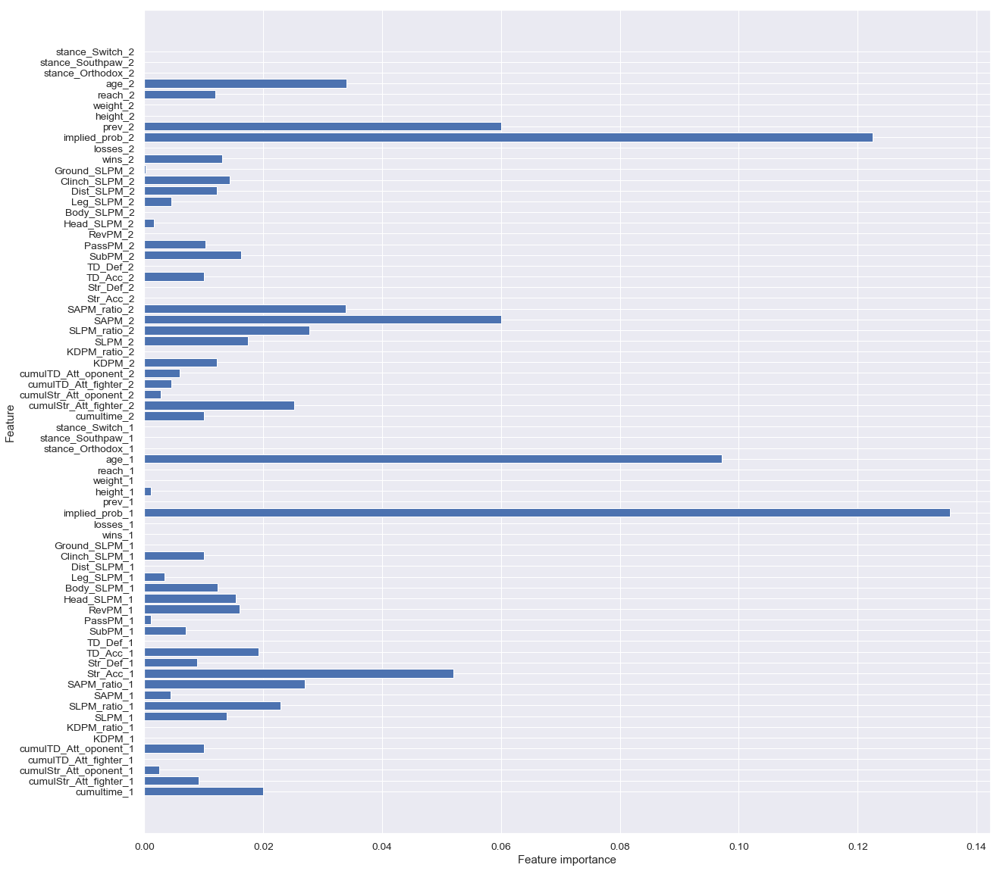

In [134]:
#importance of features
plot_feature_importances(forest2)


## Using the Random Forest Model For Gambling

In [218]:
myprobas_xtest = pd.DataFrame(forest2.predict_proba(X_test))
myprobas_xtest

,0,1
0,0.523265,0.476735
1,0.510456,0.489544
2,0.528708,0.471292
3,0.514695,0.485305
4,0.427994,0.572006
5,0.556723,0.443277
6,0.484485,0.515515
7,0.491161,0.508839
8,0.554032,0.445968
9,0.444417,0.555583


In [219]:
tested_fights = real.loc[(X_test.index)]
tested_fights = tested_fights[['date', 'fighter_1', 'implied_prob_1', 'fighter_2', 'implied_prob_2', 'winner']]
tested_fights

,date,fighter_1,implied_prob_1,fighter_2,implied_prob_2,winner
1452,2018-12-08,Claudia-Gadelha,0.735294,Nina-Ansaroff,0.270270,2
1311,2018-12-08,Olivier-Aubin-Mercier,0.546448,Gilbert-Burns,0.434783,2
324,2018-12-08,Thiago-Santos,0.649351,Jimi-Manuwa,0.363636,1
321,2018-12-08,Valentina-Shevchenko,0.746269,Joanna-Jedrzejczyk,0.273973,1
157,2018-12-08,Dhiego-Lima,0.232558,Chad-Laprise,0.787402,1
563,2018-12-08,Hakeem-Dawodu,0.636943,Kyle-Bochniak,0.362319,1
741,2018-12-08,Alex-Oliveira,0.423729,Gunnar-Nelson,0.584795,2
1394,2018-12-08,Brian-Ortega,0.495050,Max-Holloway,0.500000,2
621,2018-12-08,Aleksandar-Rakic,0.833333,Devin-Clark,0.180180,1
637,2018-12-08,Jessica-Eye,0.322581,Katlyn-Chookagian,0.680272,1


In [220]:
compare = pd.DataFrame()
compare['date'] = list(tested_fights['date'])
compare['fighter_1'] = list(tested_fights['fighter_1'])
compare['vegas_prob_1'] = list(tested_fights['implied_prob_1'])
compare['my_prob_1'] = list(myprobas_xtest[0])
compare['fighter_2'] = list(tested_fights['fighter_2'])
compare['vegas_prob_2'] = list(tested_fights['implied_prob_2'])
compare['my_prob_2'] = list(myprobas_xtest[1])
compare['winner'] = list(tested_fights['winner'])
compare = compare.sort_values(by='date')
compare

,date,fighter_1,vegas_prob_1,my_prob_1,fighter_2,vegas_prob_2,my_prob_2,winner
0,2018-12-08,Claudia-Gadelha,0.735294,0.523265,Nina-Ansaroff,0.270270,0.476735,2
1,2018-12-08,Olivier-Aubin-Mercier,0.546448,0.510456,Gilbert-Burns,0.434783,0.489544,2
2,2018-12-08,Thiago-Santos,0.649351,0.528708,Jimi-Manuwa,0.363636,0.471292,1
3,2018-12-08,Valentina-Shevchenko,0.746269,0.514695,Joanna-Jedrzejczyk,0.273973,0.485305,1
4,2018-12-08,Dhiego-Lima,0.232558,0.427994,Chad-Laprise,0.787402,0.572006,1
5,2018-12-08,Hakeem-Dawodu,0.636943,0.556723,Kyle-Bochniak,0.362319,0.443277,1
6,2018-12-08,Alex-Oliveira,0.423729,0.484485,Gunnar-Nelson,0.584795,0.515515,2
7,2018-12-08,Brian-Ortega,0.495050,0.491161,Max-Holloway,0.500000,0.508839,2
8,2018-12-08,Aleksandar-Rakic,0.833333,0.554032,Devin-Clark,0.180180,0.445968,1
9,2018-12-08,Jessica-Eye,0.322581,0.444417,Katlyn-Chookagian,0.680272,0.555583,1


In [221]:
vegas_payout_1 = []
for i in list(compare['vegas_prob_1']):
    vegas_payout_1.append(1/i)
my_payout_1 = []
for i in list(compare['my_prob_1']):
    my_payout_1.append(1/i)

vegas_payout_2 = []
for i in list(compare['vegas_prob_2']):
    vegas_payout_2.append(1/i)
my_payout_2 = []
for i in list(compare['my_prob_2']):
    my_payout_2.append(1/i)
    
compare['vegas_payout_1'] = vegas_payout_1
compare['my_payout_1'] = my_payout_1

compare['vegas_payout_2'] = vegas_payout_2
compare['my_payout_2'] = my_payout_2

In [222]:
compare

,date,fighter_1,vegas_prob_1,my_prob_1,fighter_2,vegas_prob_2,my_prob_2,winner,vegas_payout_1,my_payout_1,vegas_payout_2,my_payout_2
0,2018-12-08,Claudia-Gadelha,0.735294,0.523265,Nina-Ansaroff,0.270270,0.476735,2,1.36,1.911079,3.70,2.097600
1,2018-12-08,Olivier-Aubin-Mercier,0.546448,0.510456,Gilbert-Burns,0.434783,0.489544,2,1.83,1.959033,2.30,2.042717
2,2018-12-08,Thiago-Santos,0.649351,0.528708,Jimi-Manuwa,0.363636,0.471292,1,1.54,1.891402,2.75,2.121829
3,2018-12-08,Valentina-Shevchenko,0.746269,0.514695,Joanna-Jedrzejczyk,0.273973,0.485305,1,1.34,1.942899,3.65,2.060559
4,2018-12-08,Dhiego-Lima,0.232558,0.427994,Chad-Laprise,0.787402,0.572006,1,4.30,2.336481,1.27,1.748234
5,2018-12-08,Hakeem-Dawodu,0.636943,0.556723,Kyle-Bochniak,0.362319,0.443277,1,1.57,1.796225,2.76,2.255927
6,2018-12-08,Alex-Oliveira,0.423729,0.484485,Gunnar-Nelson,0.584795,0.515515,2,2.36,2.064048,1.71,1.939808
7,2018-12-08,Brian-Ortega,0.495050,0.491161,Max-Holloway,0.500000,0.508839,2,2.02,2.035991,2.00,1.965259
8,2018-12-08,Aleksandar-Rakic,0.833333,0.554032,Devin-Clark,0.180180,0.445968,1,1.20,1.804951,5.55,2.242312
9,2018-12-08,Jessica-Eye,0.322581,0.444417,Katlyn-Chookagian,0.680272,0.555583,1,3.10,2.250139,1.47,1.799911


In [223]:
## USING KELLY CRITERION TO FIGURE OUT THE PERCENTAGE OF BANKROLL THAT SHOULD BE BET ON A FIGHT
## ALSO INCLUDING HALF KELLY AND QUARTER KELLY TO GREATLY REDUCE RISK OF GOING BUST

kelly_1 = []
net_odds_1 = []
for i in list(compare.vegas_payout_1):
    net_odds_1.append(i-1)
for i in range(len(net_odds_1)):
    kelly_1.append((net_odds_1[i]*list(compare.my_prob_1)[i] - (1 - list(compare.my_prob_1)[i]))/net_odds_1[i])

kelly_2 = []
net_odds_2 = []
for i in list(compare.vegas_payout_2):
    net_odds_2.append(i-1)
for i in range(len(net_odds_2)):
    kelly_2.append((net_odds_2[i]*list(compare.my_prob_2)[i] - (1 - list(compare.my_prob_2)[i]))/net_odds_2[i])
    
hkelly_1 = []
for i in kelly_1:
    hkelly_1.append(i/2)
qkelly_1 = []
for i in kelly_1:
    qkelly_1.append(i/4)
    
hkelly_2 = []
for i in kelly_2:
    hkelly_2.append(i/2)
qkelly_2 = []
for i in kelly_2:
    qkelly_2.append(i/4)
    
compare['kelly_1'] = kelly_1
compare['hkelly_1'] = hkelly_1
compare['qkelly_1'] = qkelly_1
compare['kelly_2'] = kelly_2
compare['hkelly_2'] = hkelly_2
compare['qkelly_2'] = qkelly_2

compare

,date,fighter_1,vegas_prob_1,my_prob_1,fighter_2,vegas_prob_2,my_prob_2,winner,vegas_payout_1,my_payout_1,vegas_payout_2,my_payout_2,kelly_1,hkelly_1,qkelly_1,kelly_2,hkelly_2,qkelly_2
0,2018-12-08,Claudia-Gadelha,0.735294,0.523265,Nina-Ansaroff,0.270270,0.476735,2,1.36,1.911079,3.70,2.097600,-0.801000,-0.400500,-0.200250,0.282934,0.141467,0.070733
1,2018-12-08,Olivier-Aubin-Mercier,0.546448,0.510456,Gilbert-Burns,0.434783,0.489544,2,1.83,1.959033,2.30,2.042717,-0.079356,-0.039678,-0.019839,0.096885,0.048443,0.024221
2,2018-12-08,Thiago-Santos,0.649351,0.528708,Jimi-Manuwa,0.363636,0.471292,1,1.54,1.891402,2.75,2.121829,-0.344054,-0.172027,-0.086013,0.169172,0.084586,0.042293
3,2018-12-08,Valentina-Shevchenko,0.746269,0.514695,Joanna-Jedrzejczyk,0.273973,0.485305,1,1.34,1.942899,3.65,2.060559,-0.912674,-0.456337,-0.228168,0.291081,0.145540,0.072770
4,2018-12-08,Dhiego-Lima,0.232558,0.427994,Chad-Laprise,0.787402,0.572006,1,4.30,2.336481,1.27,1.748234,0.254659,0.127329,0.063665,-1.013157,-0.506579,-0.253289
5,2018-12-08,Hakeem-Dawodu,0.636943,0.556723,Kyle-Bochniak,0.362319,0.443277,1,1.57,1.796225,2.76,2.255927,-0.220955,-0.110478,-0.055239,0.126957,0.063478,0.031739
6,2018-12-08,Alex-Oliveira,0.423729,0.484485,Gunnar-Nelson,0.584795,0.515515,2,2.36,2.064048,1.71,1.939808,0.105430,0.052715,0.026357,-0.166858,-0.083429,-0.041715
7,2018-12-08,Brian-Ortega,0.495050,0.491161,Max-Holloway,0.500000,0.508839,2,2.02,2.035991,2.00,1.965259,-0.007700,-0.003850,-0.001925,0.017677,0.008839,0.004419
8,2018-12-08,Aleksandar-Rakic,0.833333,0.554032,Devin-Clark,0.180180,0.445968,1,1.20,1.804951,5.55,2.242312,-1.675809,-0.837905,-0.418952,0.324203,0.162101,0.081051
9,2018-12-08,Jessica-Eye,0.322581,0.444417,Katlyn-Chookagian,0.680272,0.555583,1,3.10,2.250139,1.47,1.799911,0.179854,0.089927,0.044963,-0.389985,-0.194992,-0.097496


In [224]:
f1_pick = []
for i in kelly_1:
    if i > 0:
        f1_pick.append(1)
    else:
        f1_pick.append(0)
f2_pick = []
for i in kelly_2:
    if i > 0:
        f2_pick.append(1)
    else:
        f2_pick.append(0)

compare['f1_pick'] = f1_pick
compare['f2_pick'] = f2_pick

compare

,date,fighter_1,vegas_prob_1,my_prob_1,fighter_2,vegas_prob_2,my_prob_2,winner,vegas_payout_1,my_payout_1,vegas_payout_2,my_payout_2,kelly_1,hkelly_1,qkelly_1,kelly_2,hkelly_2,qkelly_2,f1_pick,f2_pick
0,2018-12-08,Claudia-Gadelha,0.735294,0.523265,Nina-Ansaroff,0.270270,0.476735,2,1.36,1.911079,3.70,2.097600,-0.801000,-0.400500,-0.200250,0.282934,0.141467,0.070733,0,1
1,2018-12-08,Olivier-Aubin-Mercier,0.546448,0.510456,Gilbert-Burns,0.434783,0.489544,2,1.83,1.959033,2.30,2.042717,-0.079356,-0.039678,-0.019839,0.096885,0.048443,0.024221,0,1
2,2018-12-08,Thiago-Santos,0.649351,0.528708,Jimi-Manuwa,0.363636,0.471292,1,1.54,1.891402,2.75,2.121829,-0.344054,-0.172027,-0.086013,0.169172,0.084586,0.042293,0,1
3,2018-12-08,Valentina-Shevchenko,0.746269,0.514695,Joanna-Jedrzejczyk,0.273973,0.485305,1,1.34,1.942899,3.65,2.060559,-0.912674,-0.456337,-0.228168,0.291081,0.145540,0.072770,0,1
4,2018-12-08,Dhiego-Lima,0.232558,0.427994,Chad-Laprise,0.787402,0.572006,1,4.30,2.336481,1.27,1.748234,0.254659,0.127329,0.063665,-1.013157,-0.506579,-0.253289,1,0
5,2018-12-08,Hakeem-Dawodu,0.636943,0.556723,Kyle-Bochniak,0.362319,0.443277,1,1.57,1.796225,2.76,2.255927,-0.220955,-0.110478,-0.055239,0.126957,0.063478,0.031739,0,1
6,2018-12-08,Alex-Oliveira,0.423729,0.484485,Gunnar-Nelson,0.584795,0.515515,2,2.36,2.064048,1.71,1.939808,0.105430,0.052715,0.026357,-0.166858,-0.083429,-0.041715,1,0
7,2018-12-08,Brian-Ortega,0.495050,0.491161,Max-Holloway,0.500000,0.508839,2,2.02,2.035991,2.00,1.965259,-0.007700,-0.003850,-0.001925,0.017677,0.008839,0.004419,0,1
8,2018-12-08,Aleksandar-Rakic,0.833333,0.554032,Devin-Clark,0.180180,0.445968,1,1.20,1.804951,5.55,2.242312,-1.675809,-0.837905,-0.418952,0.324203,0.162101,0.081051,0,1
9,2018-12-08,Jessica-Eye,0.322581,0.444417,Katlyn-Chookagian,0.680272,0.555583,1,3.10,2.250139,1.47,1.799911,0.179854,0.089927,0.044963,-0.389985,-0.194992,-0.097496,1,0


In [225]:
bankroll = [5000]
mybet_1 = []
mybet_2 = []
for i in range(len(compare)):
    if compare.f1_pick[i] == 1:
        mybet_1.append(qkelly_1[i]*bankroll[i])
        mybet_2.append(0)
        if compare.winner[i] == 1:
            bankroll.append(bankroll[i] + mybet_1[i])
        else:
            bankroll.append(bankroll[i] - mybet_1[i])
    else:
        mybet_2.append(qkelly_2[i]*bankroll[i])
        mybet_1.append(0)
        if compare.winner[i] == 2:
            bankroll.append(bankroll[i] + mybet_2[i])
        else:
            bankroll.append(bankroll[i] - mybet_2[i])

In [227]:
compare['mybet_1'] = mybet_1
compare['mybet_2'] = mybet_2
compare['WINNER'] = list(compare.winner)
compare['bankroll'] = bankroll[1:]
compare.drop(['f1_pick', 'f2_pick', 'winner'], axis=1, inplace=True)
compare

,date,fighter_1,vegas_prob_1,my_prob_1,fighter_2,vegas_prob_2,my_prob_2,vegas_payout_1,my_payout_1,vegas_payout_2,my_payout_2,kelly_1,hkelly_1,qkelly_1,kelly_2,hkelly_2,qkelly_2,mybet_1,mybet_2,WINNER,bankroll
0,2018-12-08,Claudia-Gadelha,0.735294,0.523265,Nina-Ansaroff,0.270270,0.476735,1.36,1.911079,3.70,2.097600,-0.801000,-0.400500,-0.200250,0.282934,0.141467,0.070733,0.000000,353.667091,2,5353.667091
1,2018-12-08,Olivier-Aubin-Mercier,0.546448,0.510456,Gilbert-Burns,0.434783,0.489544,1.83,1.959033,2.30,2.042717,-0.079356,-0.039678,-0.019839,0.096885,0.048443,0.024221,0.000000,129.673145,2,5483.340236
2,2018-12-08,Thiago-Santos,0.649351,0.528708,Jimi-Manuwa,0.363636,0.471292,1.54,1.891402,2.75,2.121829,-0.344054,-0.172027,-0.086013,0.169172,0.084586,0.042293,0.000000,231.907546,1,5251.432690
3,2018-12-08,Valentina-Shevchenko,0.746269,0.514695,Joanna-Jedrzejczyk,0.273973,0.485305,1.34,1.942899,3.65,2.060559,-0.912674,-0.456337,-0.228168,0.291081,0.145540,0.072770,0.000000,382.147904,1,4869.284786
4,2018-12-08,Dhiego-Lima,0.232558,0.427994,Chad-Laprise,0.787402,0.572006,4.30,2.336481,1.27,1.748234,0.254659,0.127329,0.063665,-1.013157,-0.506579,-0.253289,310.001754,0.000000,1,5179.286541
5,2018-12-08,Hakeem-Dawodu,0.636943,0.556723,Kyle-Bochniak,0.362319,0.443277,1.57,1.796225,2.76,2.255927,-0.220955,-0.110478,-0.055239,0.126957,0.063478,0.031739,0.000000,164.386411,1,5014.900130
6,2018-12-08,Alex-Oliveira,0.423729,0.484485,Gunnar-Nelson,0.584795,0.515515,2.36,2.064048,1.71,1.939808,0.105430,0.052715,0.026357,-0.166858,-0.083429,-0.041715,132.179964,0.000000,2,4882.720166
7,2018-12-08,Brian-Ortega,0.495050,0.491161,Max-Holloway,0.500000,0.508839,2.02,2.035991,2.00,1.965259,-0.007700,-0.003850,-0.001925,0.017677,0.008839,0.004419,0.000000,21.578404,2,4904.298570
8,2018-12-08,Aleksandar-Rakic,0.833333,0.554032,Devin-Clark,0.180180,0.445968,1.20,1.804951,5.55,2.242312,-1.675809,-0.837905,-0.418952,0.324203,0.162101,0.081051,0.000000,397.497047,1,4506.801523
9,2018-12-08,Jessica-Eye,0.322581,0.444417,Katlyn-Chookagian,0.680272,0.555583,3.10,2.250139,1.47,1.799911,0.179854,0.089927,0.044963,-0.389985,-0.194992,-0.097496,202.641108,0.000000,1,4709.442631


# XGBoost

In [155]:
booster = xgb.XGBClassifier(random_state=20)
booster.fit(X_train, y_train)
y_pred = booster.predict(X_test)
#Printing out results
print_metrics(y_test, y_pred)

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.5916666666666667
Recall Score: 0.568
Accuracy Score: 0.5992217898832685
F1 Score: 0.5795918367346938

AUC is :0.6

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,83,49,132
1.0,54,71,125
All,137,120,257


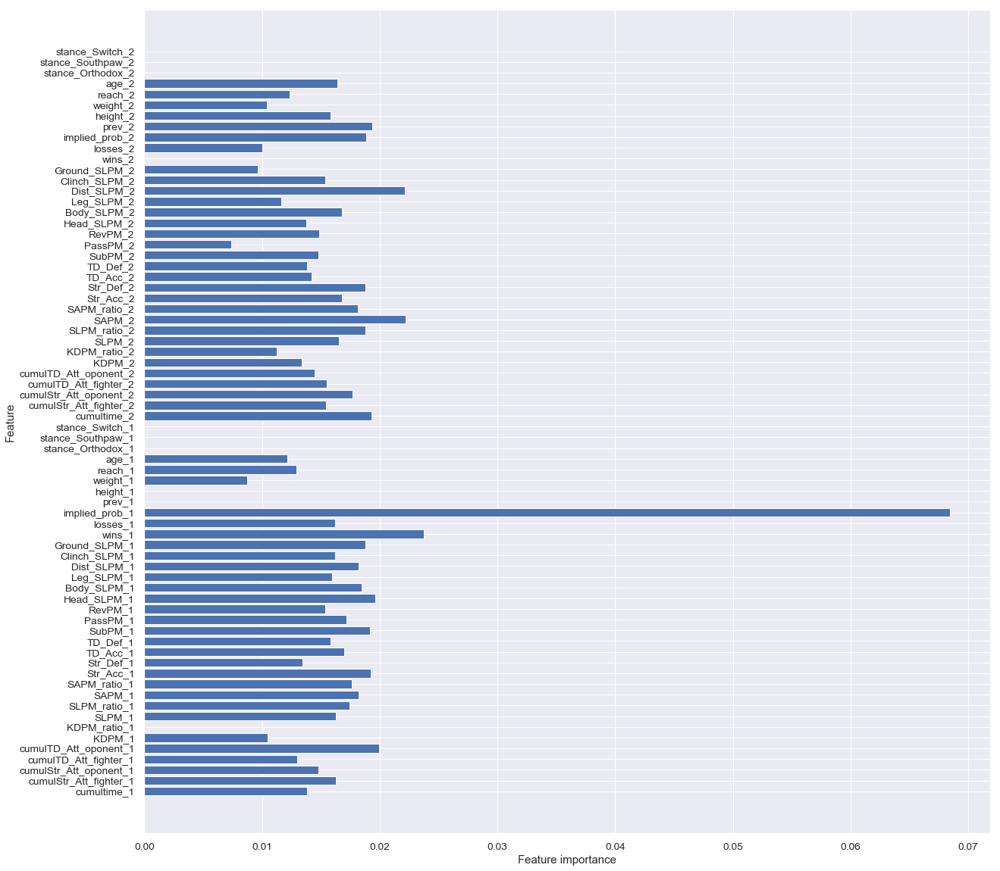

In [156]:
#importance of features
plot_feature_importances(booster)

In [186]:
param_distrib = {'max_depth': randint(1, 40),
                 'max_features': randint(1, 50),
                 'min_samples_split': randint(2, 700),
                 'min_samples_leaf': randint(2, 700),
                 'n_estimators': [10, 100]
                }
clf = RandomizedSearchCV(xgb.XGBClassifier(), param_distrib, n_iter=700)
clf.fit(X, y)
clf.best_params_

/Users/hmnathel/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


KeyboardInterrupt: 

In [ ]:
#running randomized search again
param_distrib = {'max_depth': randint(1, 40),
                 'max_features': randint(1, 50),
                 'min_samples_split': randint(2, 700),
                 'min_samples_leaf': randint(2, 700),
                 'n_estimators': [10, 100]
                }
clf = RandomizedSearchCV(xgb.XGBClassifier(), param_distrib, n_iter=700)
clf.fit(X, y)
clf.best_params_

In [ ]:
#running randomized search 3rd time
param_distrib = {'max_depth': randint(1, 40),
                 'max_features': randint(1, 50),
                 'min_samples_split': randint(2, 700),
                 'min_samples_leaf': randint(2, 700),
                 'n_estimators': [10, 100]
                }
clf = RandomizedSearchCV(xgb.XGBClassifier(), param_distrib, n_iter=700)
clf.fit(X, y)
clf.best_params_

In [110]:
#creating grid for grid search for random forest
xg_param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [20, 25, 30, 35, 40],
    'max_features': [20, 25, 30, 35, 40],
    'min_samples_split': [40, 50, 100, 200, 350],
    'min_samples_leaf': [40, 50, 100, 200, 350, 550],
    'n_estimators': [10, 30, 60, 100, 150, 200]
}

In [111]:
xg_grid_search = GridSearchCV(xgb.XGBClassifier(), xg_param_grid, cv=3, return_train_score=True, verbose=3)
xg_grid_search.fit(X, y)

Fitting 3 folds for each of 9000 candidates, totalling 27000 fits
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=10 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=10 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=10 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.4s remaining:    0.0s


[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.654), total=   0.7s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.638), total=   2.8s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.6s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.8s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.3s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.7s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   2.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   2.1s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.8s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   1.3s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.7s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.6s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.7s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   1.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   2.1s
[CV

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   1.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   2.0s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.7s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.4s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.3s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.6s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   1.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   1.1s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.5s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   2.1s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.7s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.6s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.6s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   1.0s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   2.1s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   1.2s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   2.1s
[CV

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.6s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   1.0s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   1.0s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.6s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   2.0s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   1.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.4s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.4s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   2.1s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.6s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.6s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   1.0s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gini, max

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=gi

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] crite

[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150 
[CV]  criterion=gini, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), tot

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.615), tot

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.604), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=100, n_estimators=10, score=(train=0.992, test=0.615), tot

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=150, score=(train=1.000, test=0.64

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=40, n_estimators=60, score=(train=1.000, test=0.649), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=100, n_estimators=10, score=(train=0.997, test=0.670), tot

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.604

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=40, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.597), total=   2.1s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=100, score=(train=1.000, test=0.652), t

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=40, n_estimators=10, score=(train=0.994, test=0.581), total=  

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.597), tot

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.604), tot

[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=40, n_estimators=10, score=(train=0.997, test=0.670), to

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.647), total=   1

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.649), total=   1

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=40, n_estimators=10, score=(train=0.997, test=0.670), total= 

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.647), total=   1

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.649), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=40, n_estimators=10, score=(train=0.997, test=0.670), total

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=150, score=(train=1.000, test=0.647), tot

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=60, score=(train=1.000, test=0.649), tot

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), total=   2.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.59

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.604), tota

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=20, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   2.1s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   1.1s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.5s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   1.0s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   1.0s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   2.1s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=25, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.6s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   2.0s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.5s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=30, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   1.1s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   2.1s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   1.1s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.5s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   2.0s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=35, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=20, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=25, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   2.0s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=200, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=350, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   1.0s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=30, min_samples_leaf=550, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.3s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.3s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=40, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), tot

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=50, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.618), tot

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   1.0s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.609), total=

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.590), tot

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.597), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=100, min_samples_split=350, n_estimators=200, score=(train=1.000, test=0.63

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=50, n_estimators=100, score=(train=1.000, test=0.652), total=  

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=200, n_estimators=30, score=(train=1.000, test=0.654), tot

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   1.8s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.615), total=   1.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=200, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.59

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.8s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.994, test=0.581), to

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604), total=   2.0s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), total=   2.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=350, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.61

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.604), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670), total=   0.2s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.992, test=0.615), 

[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=35, min_samples_leaf=550, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.64

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.654), total=   0.6s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670), total

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=40, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), tot

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0.9s
[CV

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.638), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670), total

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=50, min_samples_split=350, n_estimators=150, score=(train=1.000, test=0.647), tot

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670)

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=100, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670)

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.652), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=200, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670)

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=350, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.654), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.590), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=30 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=30, score=(train=1.000, test=0.595), total=   0.5s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=50, n_estimators=60, score=(train=1.000, test=0.649), total=   0

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.638), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.618), total=   2.2s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=200 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=100, n_estimators=200, score=(train=1.000, test=0.590), total=   2.8s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=200, n_estimators=10, score=(train=0.997, test=0.670)

[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=60, score=(train=1.000, test=0.604), total=   0.9s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.652), total=   1.4s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.609), total=   1.3s
[CV] criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=100 
[CV]  criterion=entropy, max_depth=40, max_features=40, min_samples_leaf=550, min_samples_split=350, n_estimators=100, score=(train=1.000, test=0.604

[Parallel(n_jobs=1)]: Done 27000 out of 27000 | elapsed: 529.2min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0,
                                     learning_rate=0.1, max_delta_step=0,
                                     max_depth=3, min_child_weight=1,
                                     missing=None, n_estimators=100, n_jobs=1,
                                     nthread=None, objective='binary:logistic',
                                     random_state=0, reg_alpha=0, reg_l...
                                     subsample=1, verbosity=1),
             iid='warn', n_jobs=None,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [20, 25, 30, 35, 40],
                         'max_features': [20, 25, 30, 35, 40],
                         'min_samples_leaf': [40, 50, 100, 200, 350, 55

In [112]:
xg_gs_training_score = np.mean(xg_grid_search.cv_results_['mean_train_score'])
xg_gs_testing_score = xg_grid_search.score(X, y)

print("Mean Training Score: {:.4}%".format(xg_gs_training_score * 100))
print("Mean Testing Score: {:.4}%".format(xg_gs_testing_score * 100))
print("Best Parameter Combination Found During Grid Search:")
xg_grid_search.best_params_

Mean Training Score: 99.91%
Mean Testing Score: 99.7%
Best Parameter Combination Found During Grid Search:


{'criterion': 'gini',
 'max_depth': 20,
 'max_features': 20,
 'min_samples_leaf': 40,
 'min_samples_split': 40,
 'n_estimators': 10}

In [721]:
xg2 = xgb.XGBClassifier(criterion='gini',
                        max_depth=20,
                        max_features=20,
                        min_samples_leaf=40,
                        min_samples_split=40,
                        n_estimators=10,
                       randomstate=20)  
xg2.fit(X_train, y_train)
y_pred = xg2.predict(X_test)

#Printing out results
print_metrics(y_test, y_pred)

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print("\nAUC is :{0}".format(round(roc_auc,2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Precision Score: 0.6055045871559633
Recall Score: 0.55
Accuracy Score: 0.5975103734439834
F1 Score: 0.5764192139737991

AUC is :0.6

Confusion Matrix
----------------


Predicted,0.0,1.0,All
True,,,
0.0,78,43,121
1.0,54,66,120
All,132,109,241


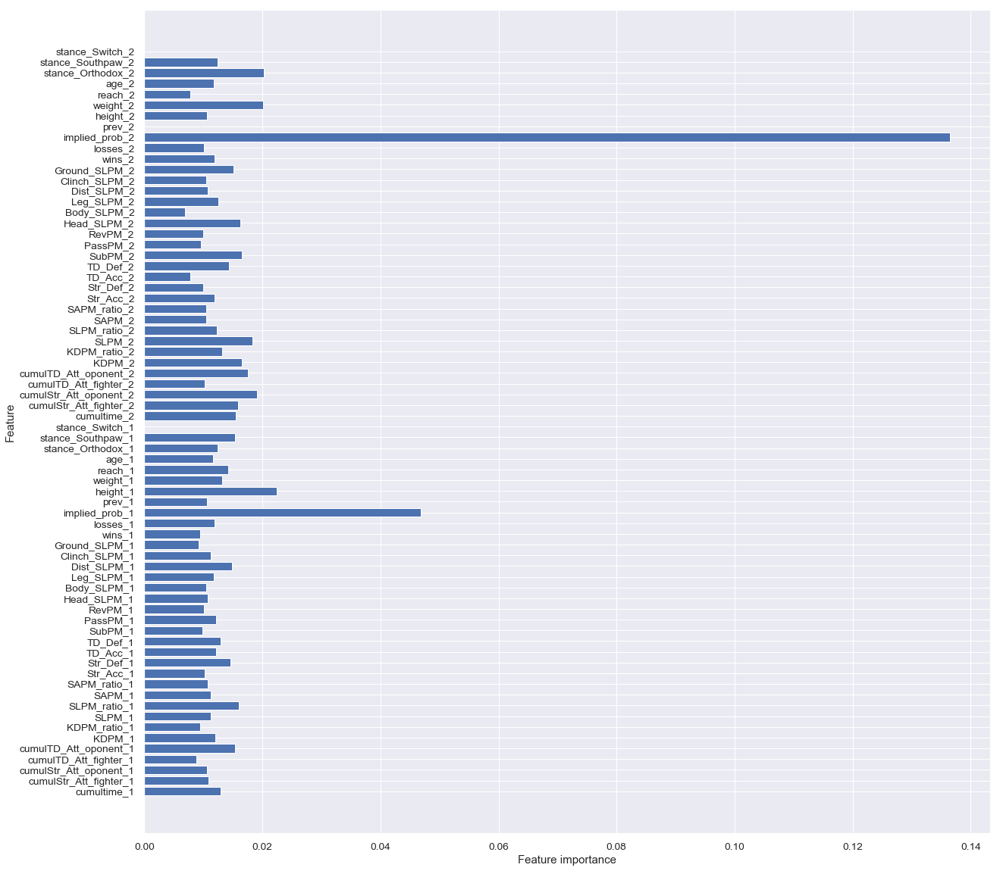

In [722]:
#importance of features
plot_feature_importances(xg2)